In [1]:
# Standard libraries
import pandas as pd
from scipy.stats import chi2_contingency

# Enable auto-reload for module reloading during development
%load_ext autoreload
%autoreload 2

# Set display options for Pandas to show all columns
pd.set_option('display.max_columns', None)

# Load custom scripts
import scripts.eda_functions as eda
import scripts.data_cleaning as dc
import scripts.data_check as ch


# Data Quality Analysis (Data Cleaning and Manipulation)

In [2]:
# Load dataset
transactions = pd.read_csv('data/fraudTest.csv')

In [3]:
# First look at the first few rows of the dataset
transactions.head(5)

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.86,Jeff,Elliott,M,351 Darlene Green,Columbia,SC,29209,33.9659,-80.9355,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0
1,1,2020-06-21 12:14:33,3573030041201292,fraud_Sporer-Keebler,personal_care,29.84,Joanne,Williams,F,3638 Marsh Union,Altonah,UT,84002,40.3207,-110.4360,302,"Sales professional, IT",1990-01-17,324cc204407e99f51b0d6ca0055005e7,1371816873,39.450498,-109.960431,0
2,2,2020-06-21 12:14:53,3598215285024754,"fraud_Swaniawski, Nitzsche and Welch",health_fitness,41.28,Ashley,Lopez,F,9333 Valentine Point,Bellmore,NY,11710,40.6729,-73.5365,34496,"Librarian, public",1970-10-21,c81755dbbbea9d5c77f094348a7579be,1371816893,40.495810,-74.196111,0
3,3,2020-06-21 12:15:15,3591919803438423,fraud_Haley Group,misc_pos,60.05,Brian,Williams,M,32941 Krystal Mill Apt. 552,Titusville,FL,32780,28.5697,-80.8191,54767,Set designer,1987-07-25,2159175b9efe66dc301f149d3d5abf8c,1371816915,28.812398,-80.883061,0
4,4,2020-06-21 12:15:17,3526826139003047,fraud_Johnston-Casper,travel,3.19,Nathan,Massey,M,5783 Evan Roads Apt. 465,Falmouth,MI,49632,44.2529,-85.0170,1126,Furniture designer,1955-07-06,57ff021bd3f328f8738bb535c302a31b,1371816917,44.959148,-85.884734,0


In [4]:
# Check data types, number of missing values, duplicates, and unique values
ch.check(transactions)

# Good news: There are no missing values or duplicate records!

Number of columns: 23 and rows: 555719

Data types:
Unnamed: 0                 int64
trans_date_trans_time     object
cc_num                     int64
merchant                  object
category                  object
amt                      float64
first                     object
last                      object
gender                    object
street                    object
city                      object
state                     object
zip                        int64
lat                      float64
long                     float64
city_pop                   int64
job                       object
dob                       object
trans_num                 object
unix_time                  int64
merch_lat                float64
merch_long               float64
is_fraud                   int64
dtype: object

Unique values count:
Unnamed: 0               555719
trans_date_trans_time    544760
cc_num                      924
merchant                    693
category                 

In [5]:
# Formatting column names using snake case
transactions_clean = dc.snake(transactions)

# Dropping unnecessary columns:
# - 'unnamed:_0' is redundant as it is equivalent to the index column.
# - 'unix_time' is not needed since the transaction date and time are already in a separate column.
transactions_clean = dc.drop_col(transactions_clean, ["unnamed:_0", "unix_time", "trans_num"])

# Removing the word 'fraud_' from the beginning of the merchant names
transactions_clean = dc.remove_prefix_from_column(transactions_clean, 'merchant', 'fraud_')

# Cleaning the 'category' column by removing underscores and capitalizing the names
transactions_clean = dc.clean_category_column(transactions_clean, 'category')

# Gender in long format
transactions_clean = dc.clean_gender_column(transactions_clean)

# State in long format (expanding abbreviations)
transactions_clean = dc.replace_state_abbreviations(transactions_clean)

# Convert 'trans_date_trans_time' and 'dob' (date of birth) to datetime format
transactions_clean = dc.convert_to_datetime(transactions_clean, ['trans_date_trans_time', 'dob'])

# Add age column based on 'dob'
transactions_clean = dc.age_calculator(transactions_clean)

# Adding hour, day, month, day of the week columns to the data frame
transactions_clean = dc.preprocess_datetime(transactions_clean)

# Let's check these changes
transactions_clean.head(5)

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,merch_lat,merch_long,is_fraud,age,hour,day,month,day_of_week
0,2020-06-21 12:14:25,2291163933867244,Kirlin and Sons,Personal Care,2.86,Jeff,Elliott,Male,351 Darlene Green,Columbia,South Carolina,29209,33.9659,-80.9355,333497,Mechanical engineer,1968-03-19,33.986391,-81.200714,0,57,12,21,6,Sunday
1,2020-06-21 12:14:33,3573030041201292,Sporer-Keebler,Personal Care,29.84,Joanne,Williams,Female,3638 Marsh Union,Altonah,Utah,84002,40.3207,-110.4360,302,"Sales professional, IT",1990-01-17,39.450498,-109.960431,0,35,12,21,6,Sunday
2,2020-06-21 12:14:53,3598215285024754,"Swaniawski, Nitzsche and Welch",Health Fitness,41.28,Ashley,Lopez,Female,9333 Valentine Point,Bellmore,New York,11710,40.6729,-73.5365,34496,"Librarian, public",1970-10-21,40.495810,-74.196111,0,54,12,21,6,Sunday
3,2020-06-21 12:15:15,3591919803438423,Haley Group,Misc Pos,60.05,Brian,Williams,Male,32941 Krystal Mill Apt. 552,Titusville,Florida,32780,28.5697,-80.8191,54767,Set designer,1987-07-25,28.812398,-80.883061,0,37,12,21,6,Sunday
4,2020-06-21 12:15:17,3526826139003047,Johnston-Casper,Travel,3.19,Nathan,Massey,Male,5783 Evan Roads Apt. 465,Falmouth,Michigan,49632,44.2529,-85.0170,1126,Furniture designer,1955-07-06,44.959148,-85.884734,0,69,12,21,6,Sunday


In [6]:
# Re-checking the data types of the transactions_clean DataFrame
ch.check(transactions_clean)

Number of columns: 25 and rows: 555719

Data types:
trans_date_trans_time    datetime64[ns]
cc_num                            int64
merchant                         object
category                         object
amt                             float64
first                            object
last                             object
gender                           object
street                           object
city                             object
state                            object
zip                               int64
lat                             float64
long                            float64
city_pop                          int64
job                              object
dob                      datetime64[ns]
merch_lat                       float64
merch_long                      float64
is_fraud                          int64
age                               int64
hour                              int32
day                               int32
month                       

In [7]:
# Save the cleaned DataFrame to a new CSV file
transactions_clean.to_csv('data/cleaned_transactions.csv', index=False)

In [8]:
# Save a copy for Tableau
transactions_clean.to_csv('data/fraud_detection_project_tableau.csv', index=True)

In [9]:
# Import the cleaned CSV file into a new DataFrame
df = pd.read_csv('data/cleaned_transactions.csv')


In [10]:
# A look at the first few rows of the cleaned dataset
df.head(5)

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,merch_lat,merch_long,is_fraud,age,hour,day,month,day_of_week
0,2020-06-21 12:14:25,2291163933867244,Kirlin and Sons,Personal Care,2.86,Jeff,Elliott,Male,351 Darlene Green,Columbia,South Carolina,29209,33.9659,-80.9355,333497,Mechanical engineer,1968-03-19,33.986391,-81.200714,0,57,12,21,6,Sunday
1,2020-06-21 12:14:33,3573030041201292,Sporer-Keebler,Personal Care,29.84,Joanne,Williams,Female,3638 Marsh Union,Altonah,Utah,84002,40.3207,-110.4360,302,"Sales professional, IT",1990-01-17,39.450498,-109.960431,0,35,12,21,6,Sunday
2,2020-06-21 12:14:53,3598215285024754,"Swaniawski, Nitzsche and Welch",Health Fitness,41.28,Ashley,Lopez,Female,9333 Valentine Point,Bellmore,New York,11710,40.6729,-73.5365,34496,"Librarian, public",1970-10-21,40.495810,-74.196111,0,54,12,21,6,Sunday
3,2020-06-21 12:15:15,3591919803438423,Haley Group,Misc Pos,60.05,Brian,Williams,Male,32941 Krystal Mill Apt. 552,Titusville,Florida,32780,28.5697,-80.8191,54767,Set designer,1987-07-25,28.812398,-80.883061,0,37,12,21,6,Sunday
4,2020-06-21 12:15:17,3526826139003047,Johnston-Casper,Travel,3.19,Nathan,Massey,Male,5783 Evan Roads Apt. 465,Falmouth,Michigan,49632,44.2529,-85.0170,1126,Furniture designer,1955-07-06,44.959148,-85.884734,0,69,12,21,6,Sunday


In [11]:
# Convert 'trans_date_trans_time' and 'dob' (date of birth) to datetime in the new DataFrame
df = dc.convert_to_datetime(df, ['trans_date_trans_time', 'dob'])

# Convert date_of_week to a categorica column in the new DataFrame
df = dc.preprocess_datetime(df)

In [12]:
# Re-checking the data types of the cleaned DataFrame
ch.check(df)

Number of columns: 25 and rows: 555719

Data types:
trans_date_trans_time    datetime64[ns]
cc_num                            int64
merchant                         object
category                         object
amt                             float64
first                            object
last                             object
gender                           object
street                           object
city                             object
state                            object
zip                               int64
lat                             float64
long                            float64
city_pop                          int64
job                              object
dob                      datetime64[ns]
merch_lat                       float64
merch_long                      float64
is_fraud                          int64
age                               int64
hour                              int32
day                               int32
month                       

# Analysis of the Data (EDA and Descriptive Statistics)

## Fraud vs. Non-Fraud Analysis

### 1.  What percentage of transactions in the dataset are fraudulent?

In [13]:
frequency_table, frequency_table_total = eda.calculate_fraud_percentage(df)
print(f'The percentage of fraud is {frequency_table["Relative frequency"].iloc[0]} % '
      f'and the percentage of non-fraud is {frequency_table["Relative frequency"].iloc[1].round(2)} %')
frequency_table_total

The percentage of fraud is 99.61 % and the percentage of non-fraud is 0.39 %


,Absolute frequency,Relative frequency
Non-Fraud,553574,99.61
Fraud,2145,0.39
Total,555719,100.00


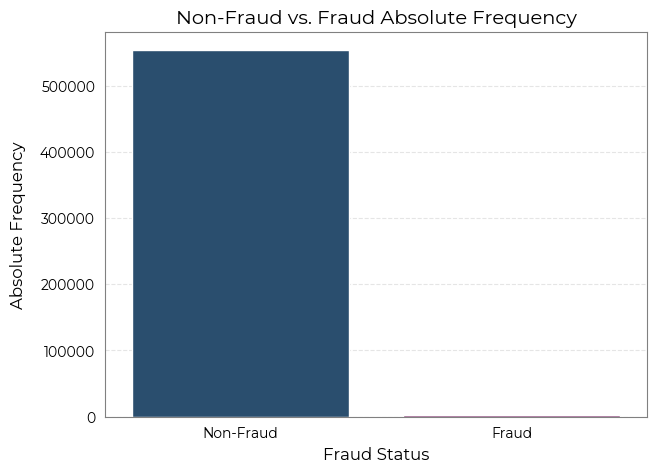

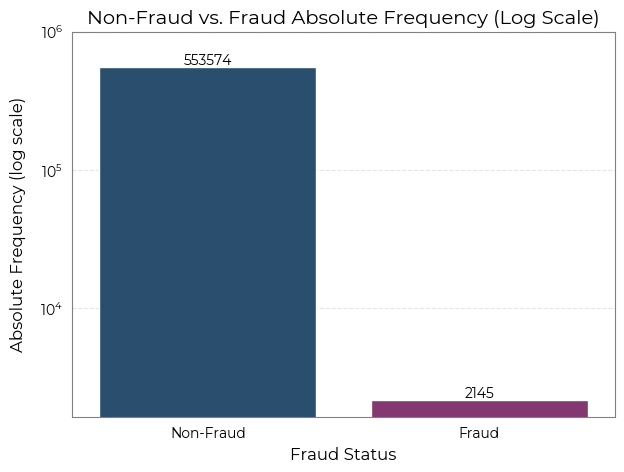

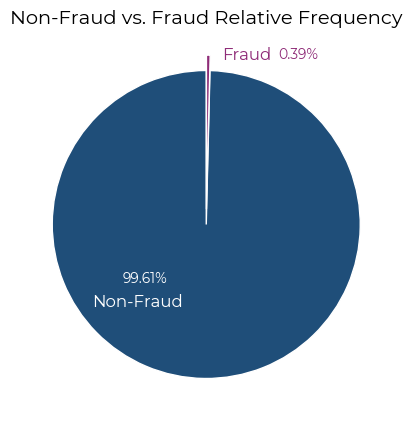

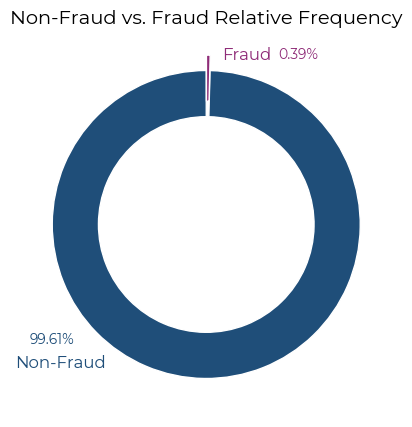

In [14]:
eda.plot_fraud_percentage(df)

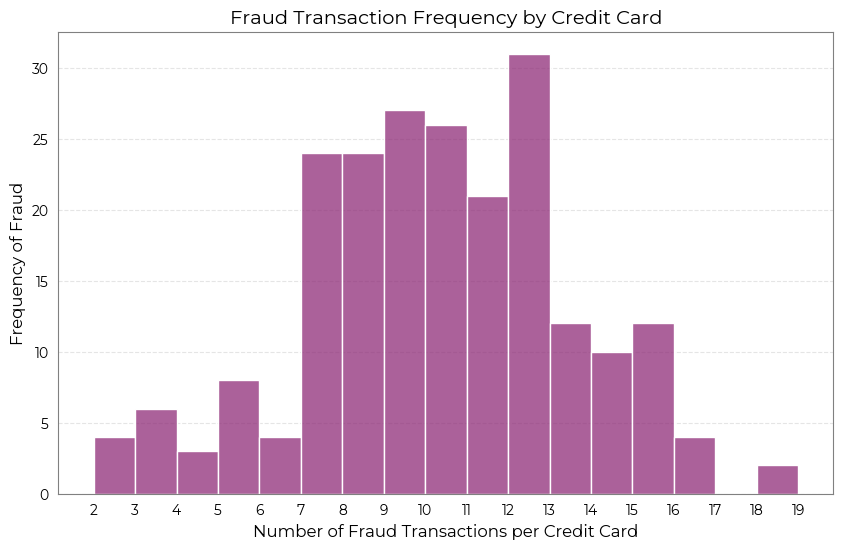

In [15]:
eda.plot_fraud_frequency_by_card(df)

### 2.  What are the average amounts of fraud vs. non-fraud transactions?

In [16]:
avg_transaction_amounts = eda.analyze_transaction_amounts(df)
avg_transaction_amounts

,Average transactions value
Non-Fraud,67.614408
Fraud,528.356494


In [17]:
fraud_stats = eda.fraud_statistics(df)
fraud_stats

,Count,Mean,Median,Mode,Std,Min,Max,25%,75%,IQR
Non-Fraud,553574,67.614408,47.15,1.10,152.471931,1.00,22768.11,9.60,82.62,73.02
Fraud,2145,528.356494,371.94,7.99,392.747594,1.78,1320.92,214.51,907.77,693.26


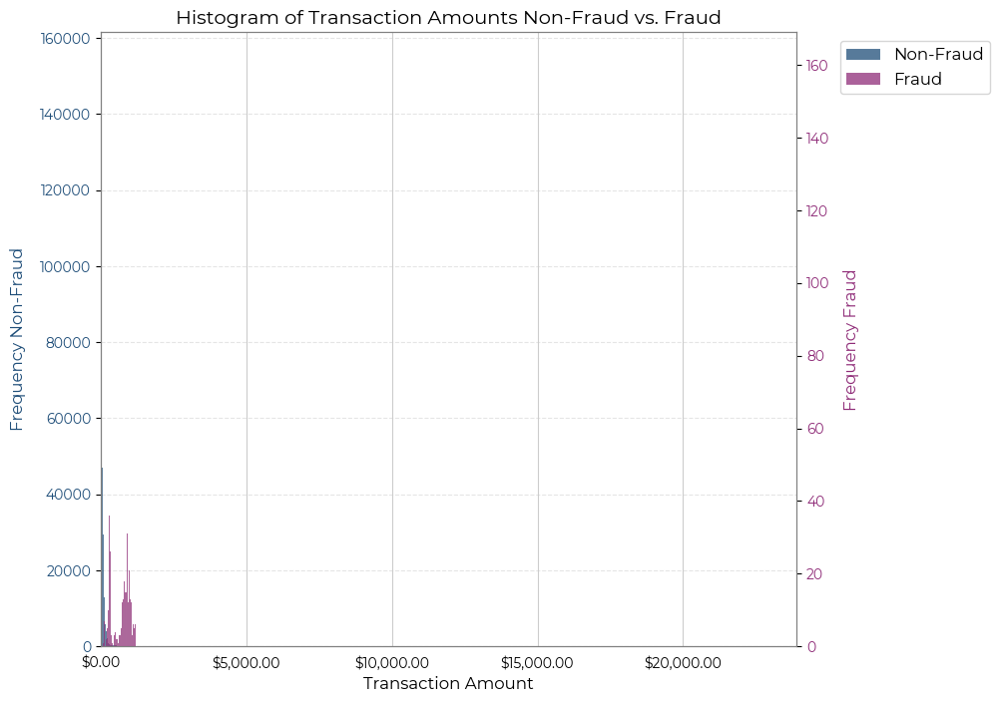

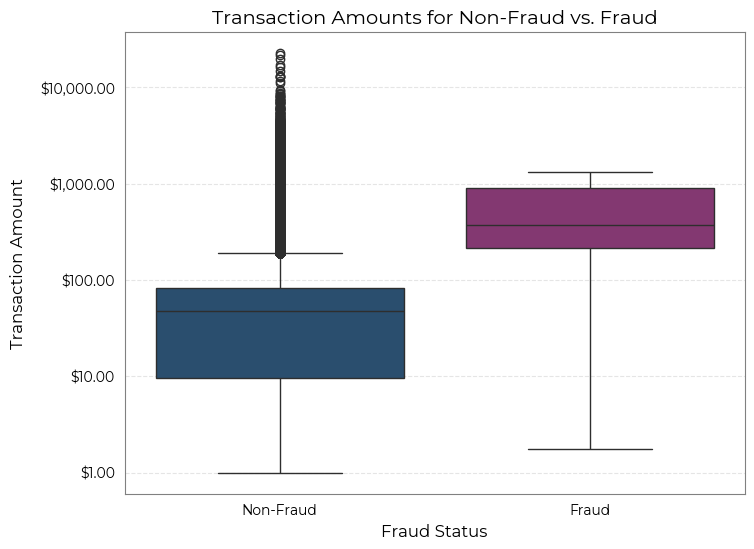

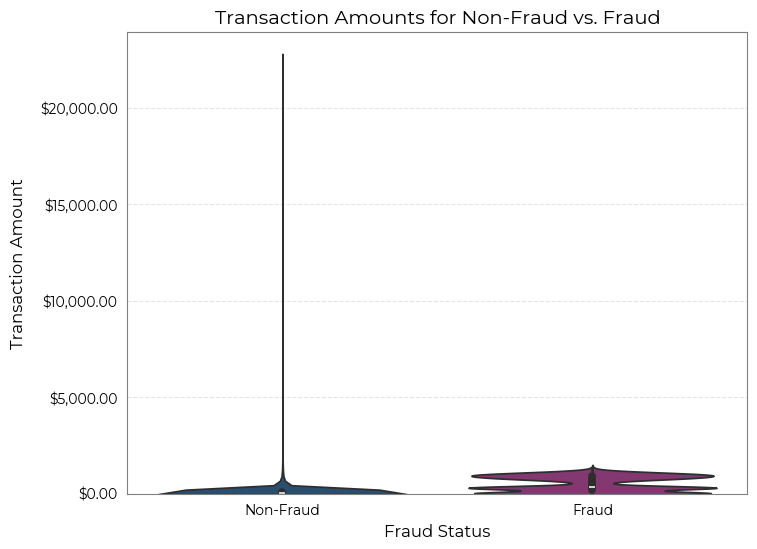

In [18]:
eda.plot_fraud_transaction_amounts(df, False)

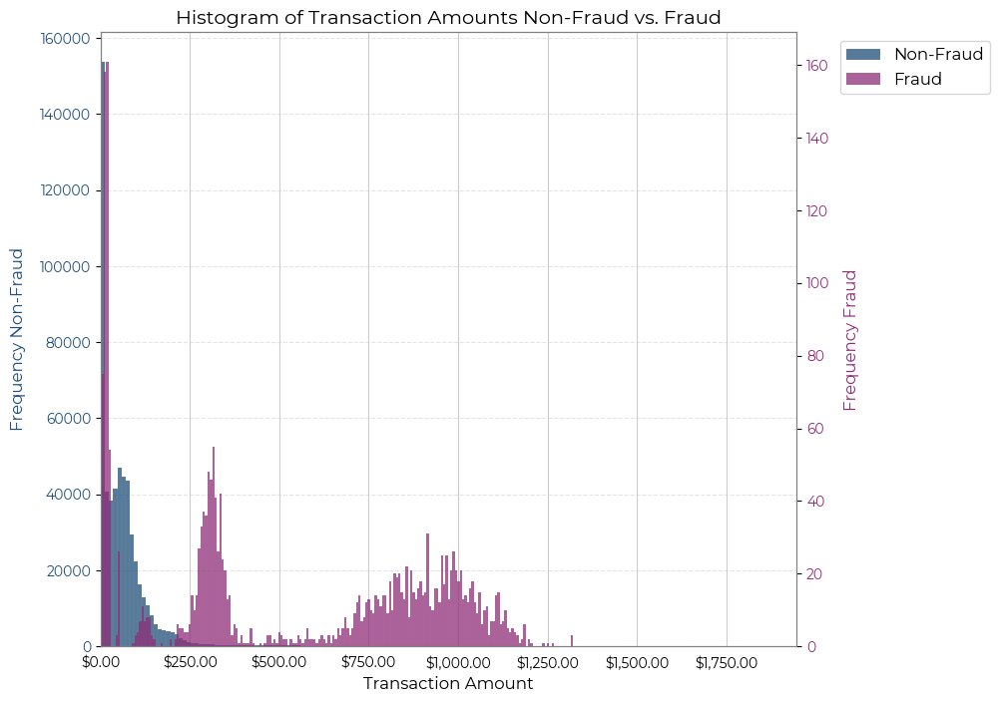

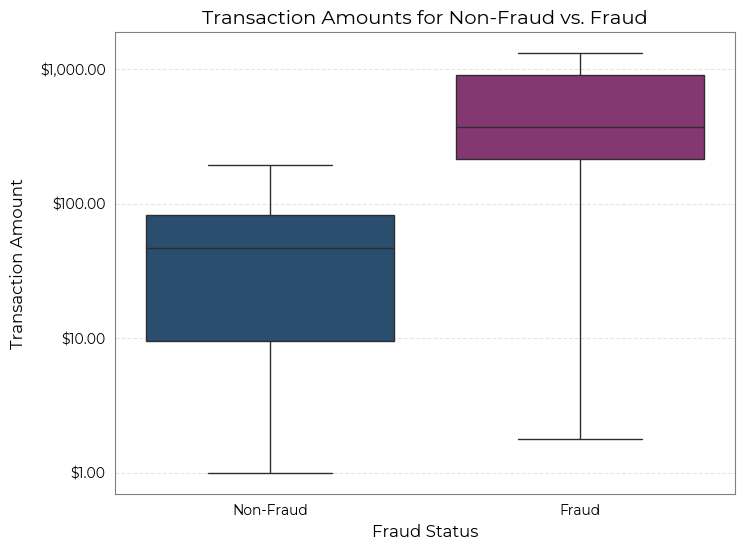

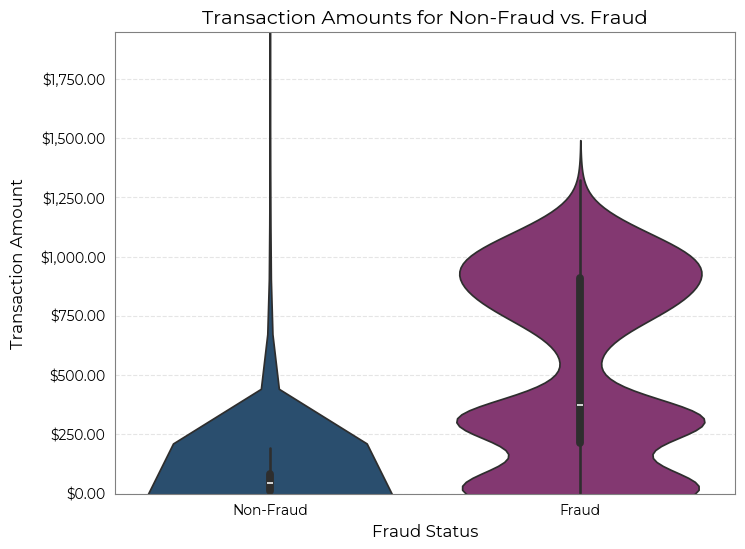

In [19]:
eda.plot_fraud_transaction_amounts(df, True)

In [20]:
# Calculate the Skewness for Non-Fraud Transactions
df[df['is_fraud'] == 'Non-Fraud']['amt'].skew().round(2)

# The distribution is positively skewed (or right-skewed), meaning there is a longer tail on the right side of the distribution. 
# The mass of the distribution is concentrated on the left of the figure with large amount of outliers with large values


np.float64(40.2)

In [21]:
# Calculate the Kurtosis for Non-Fraud Transactions
df[df['is_fraud'] == 'Non-Fraud']['amt'].kurtosis().round(2)

# Kurtosis > 0 : The distribution is leptokurtic. 
# It has fatter tails and a sharper peak than the normal distribution, indicating more extreme values (outliers) than expected in a normal distribution.

np.float64(3641.06)

## Fraud Trends Over Time

### 3.  Do fraud transactions spike at certain hours of the day?

In [22]:
# Non-Fraud and Fraud Transactions counts by hour
fraud_counts = eda.fraud_trends(df, 'hour')
fraud_counts

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
Fraud,188,169,168,194,15,20,14,16,10,14,12,17,17,14,14,21,21,16,30,24,36,27,550,538
Non-Fraud,17965,18292,17972,18005,18060,17897,18092,18082,17983,18032,18037,18071,28020,28164,28190,28027,28542,28048,27971,27901,27947,28178,27838,28260


In [23]:
# Mean of Non-Fraud and Fraud Transactions by hour
fraud_counts = eda.fraud_trends(df, 'hour','mean')
fraud_counts

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
Fraud,346.50,388.28,376.83,375.07,275.75,305.59,344.60,392.03,328.04,422.38,361.70,368.21,624.71,711.60,683.56,529.21,513.95,527.67,657.63,519.09,623.26,651.30,621.58,651.99
Non-Fraud,74.29,75.94,76.52,75.86,75.47,75.54,76.11,75.91,76.04,75.94,74.96,75.97,64.57,61.94,63.46,62.58,62.02,62.97,62.98,60.31,61.88,62.36,62.17,61.70


c:\Users\Arturo\Documents\Annie_DAML_course\Week3\fraud-detection-project\scripts\eda_functions.py:597: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data_frame['is_fraud'] = data_frame['is_fraud'].replace({'Non-Fraud': 0, 'Fraud': 1}).astype(int).infer_objects()


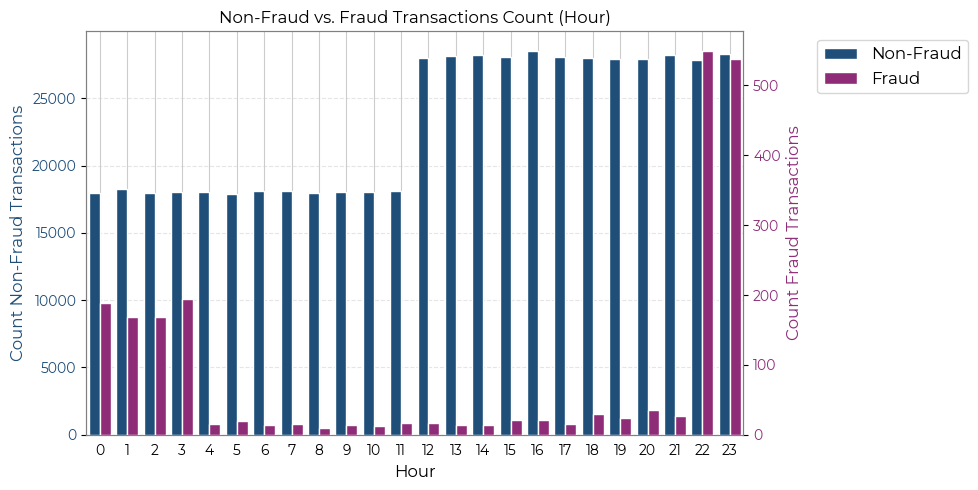

In [24]:
eda.plot_fraud_trends(df, 'hour')

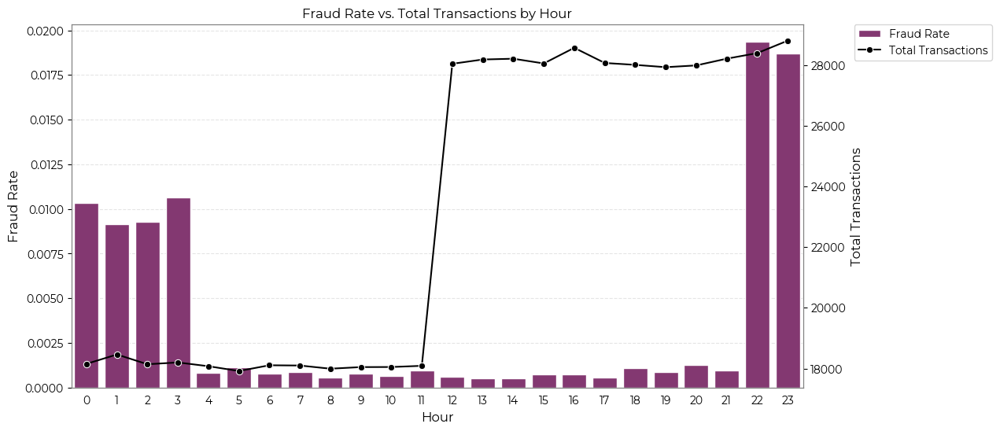

In [25]:
eda.plot_fraud_rate_by_time(df, 'hour')


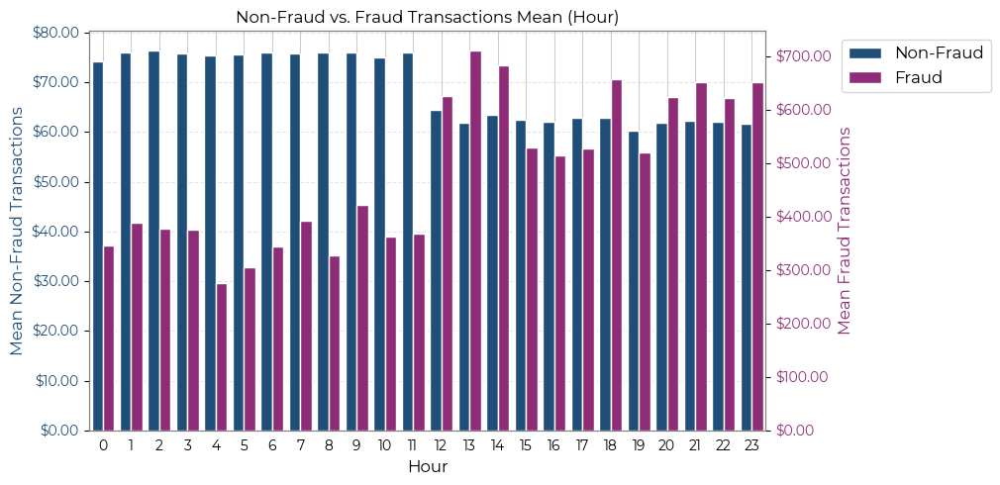

In [26]:
eda.plot_fraud_trends(df, 'hour', 'mean')

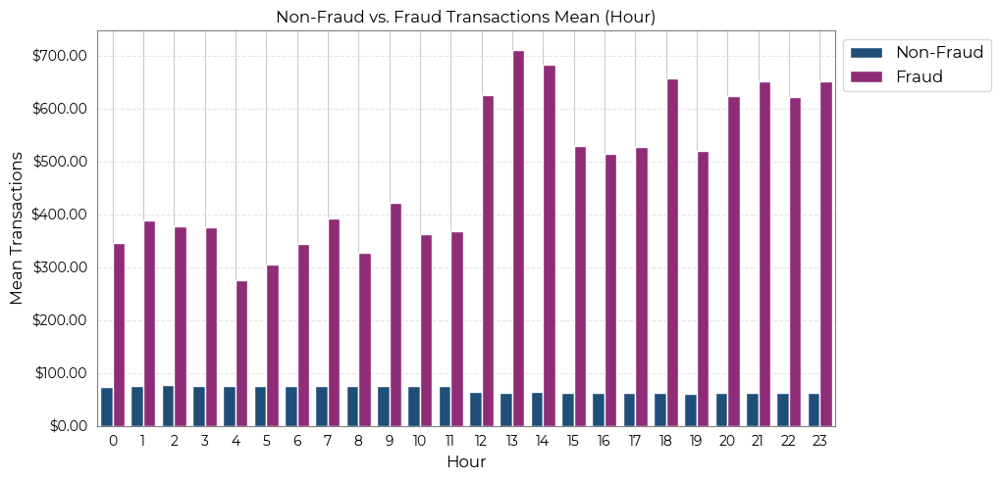

In [27]:
eda.plot_fraud_trends_same_axes(df, 'hour', 'mean')

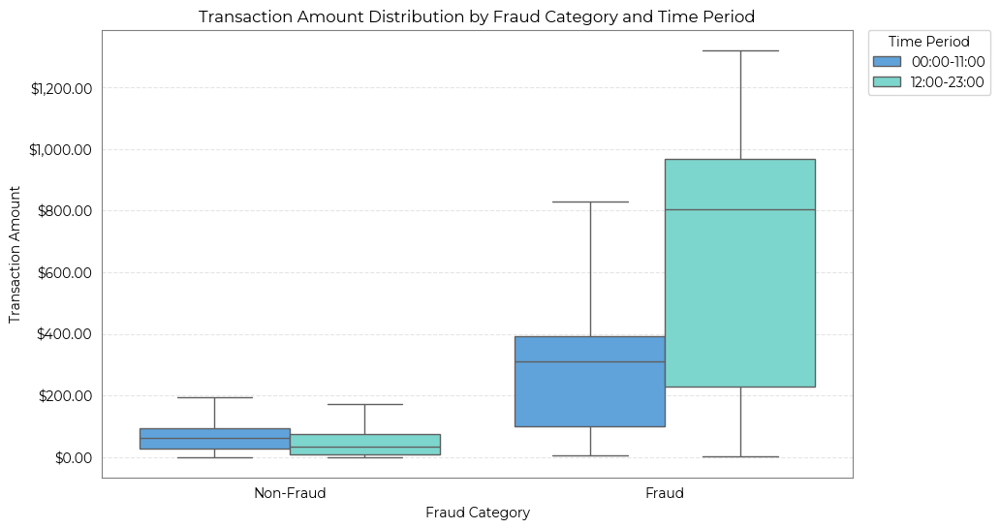

In [28]:
eda.plot_fraud_boxplots(df)

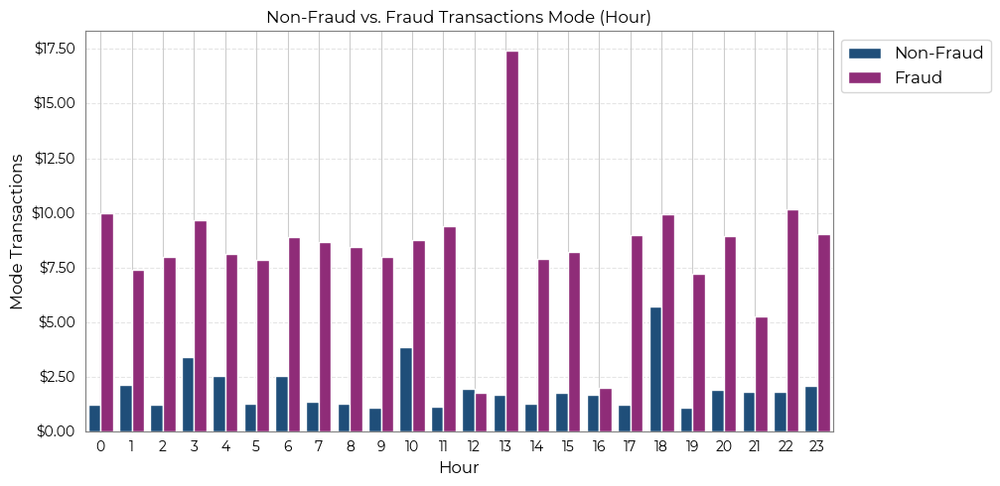

In [29]:
eda.plot_fraud_trends_same_axes(df, 'hour', 'mode')

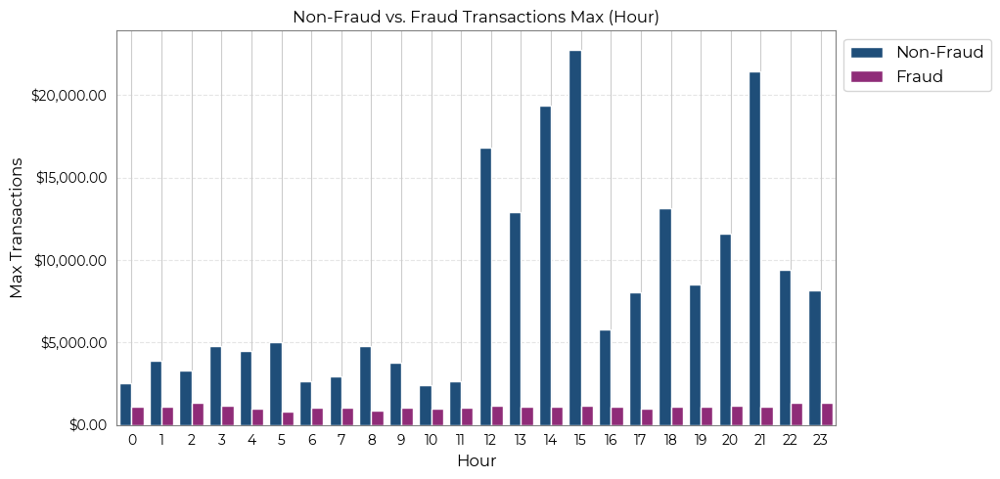

In [30]:
eda.plot_fraud_trends_same_axes(df, 'hour', 'max')

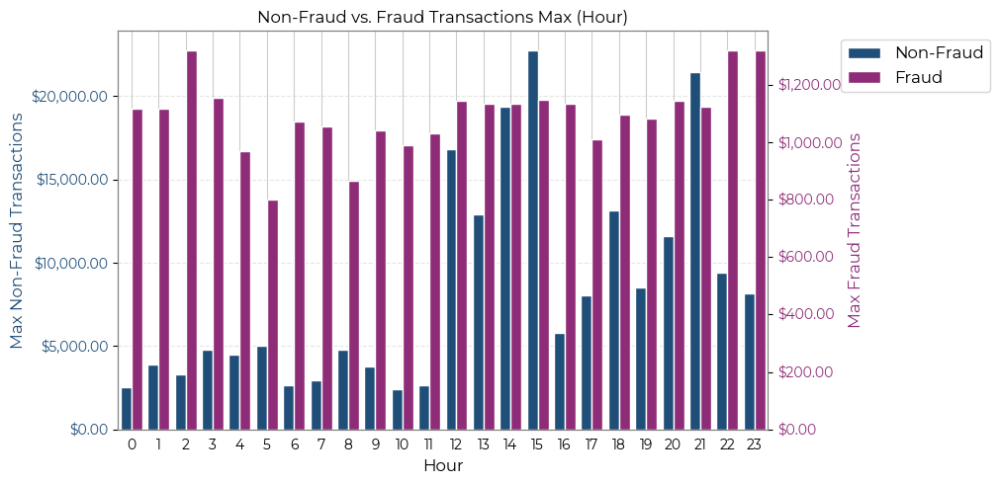

In [31]:
eda.plot_fraud_trends(df, 'hour', 'max')

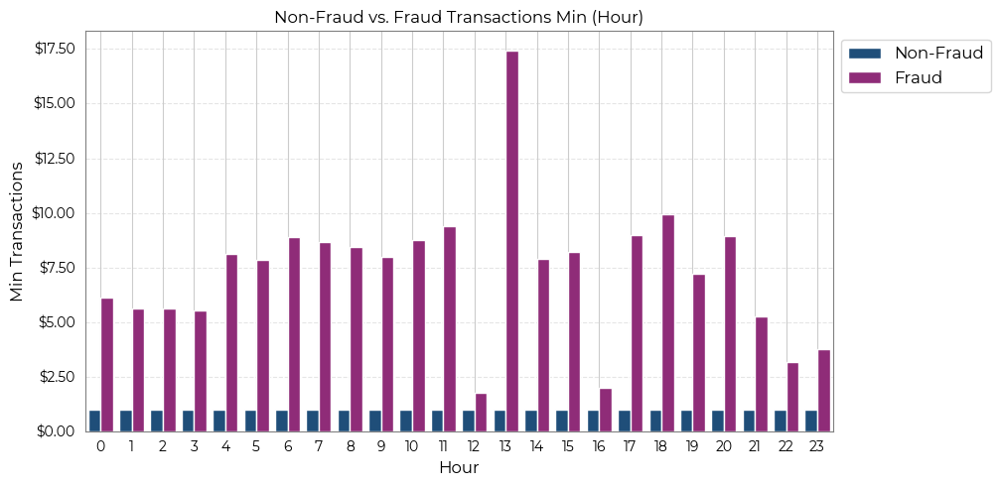

In [32]:
eda.plot_fraud_trends_same_axes(df, 'hour', 'min')

### 4. Do fraud transactions spike at certain day of the month?

In [33]:
fraud_counts = eda.fraud_trends(df, 'day')
fraud_counts

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31
Fraud,18549,14962,16353,15955,15660,19146,19336,17596,15338,16666,16108,15579,19080,19078,17573,14891,16268,15955,15817,19214,21090,21561,18821,17950,17726,18078,21344,22385,21781,22133,11581
Non-Fraud,53,52,76,112,109,87,90,110,49,51,87,78,66,54,58,55,51,61,59,71,61,58,56,81,107,78,92,55,34,65,29


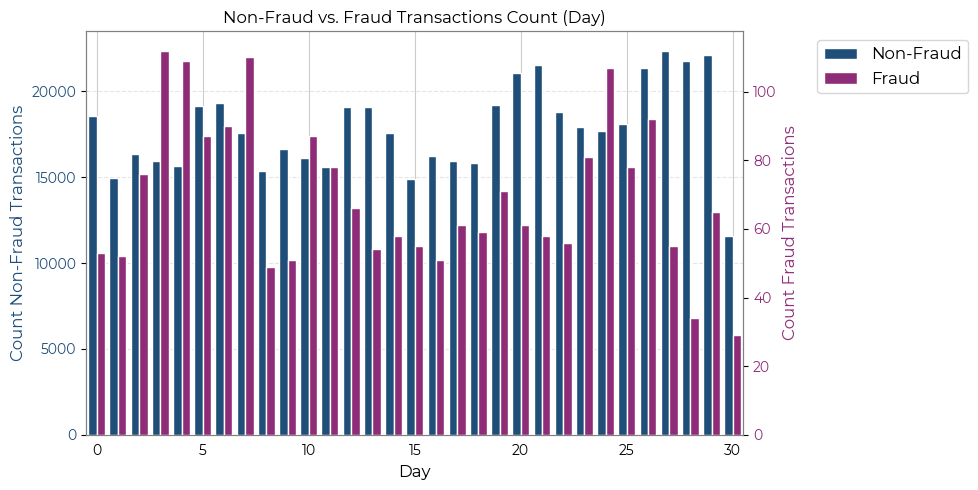

In [34]:
eda.plot_fraud_trends(df, 'day')

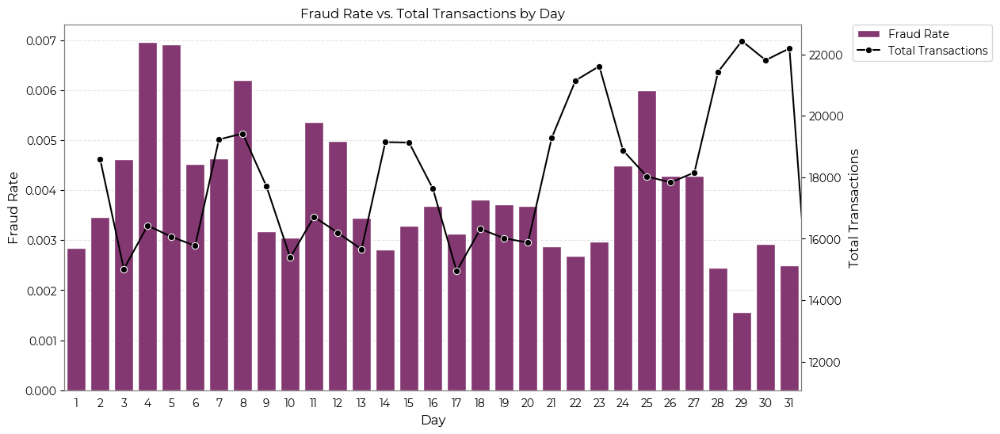

In [35]:
eda.plot_fraud_rate_by_time(df, 'day')

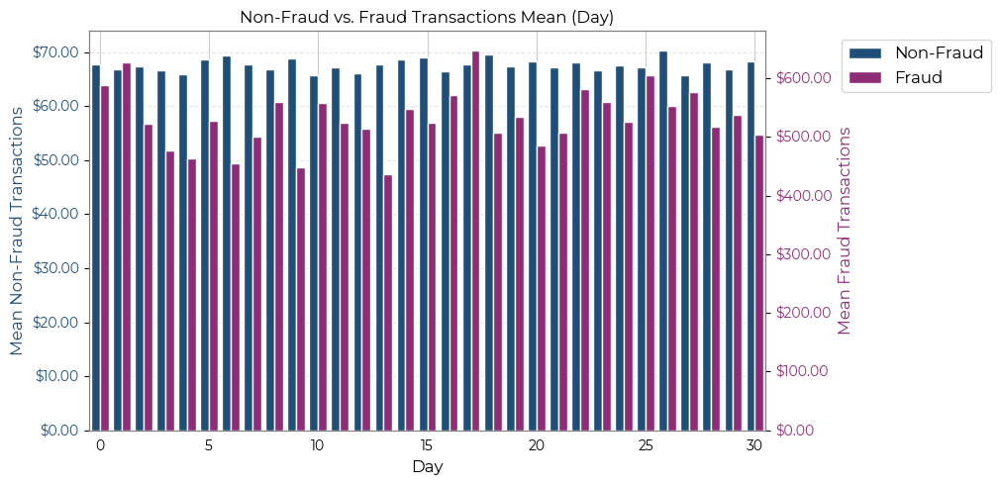

In [36]:
eda.plot_fraud_trends(df, 'day', 'mean')

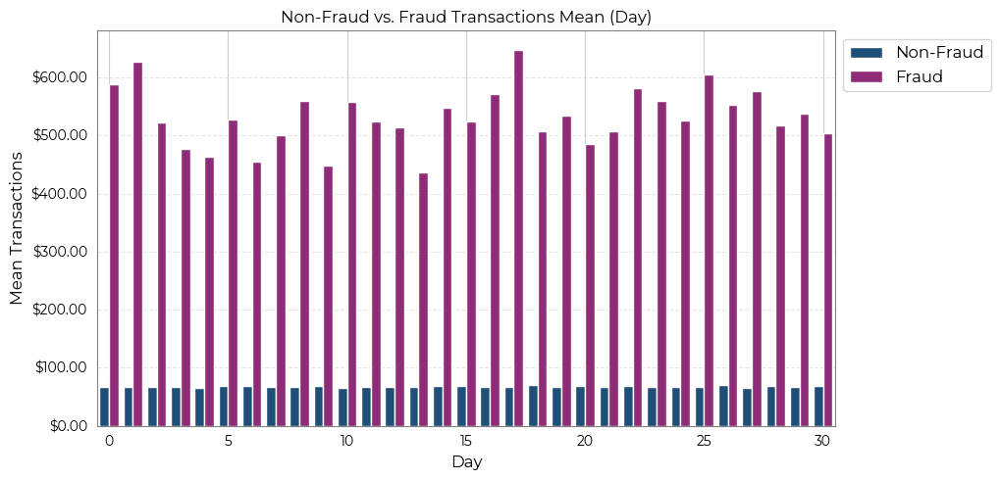

In [37]:
eda.plot_fraud_trends_same_axes(df, 'day', 'mean')

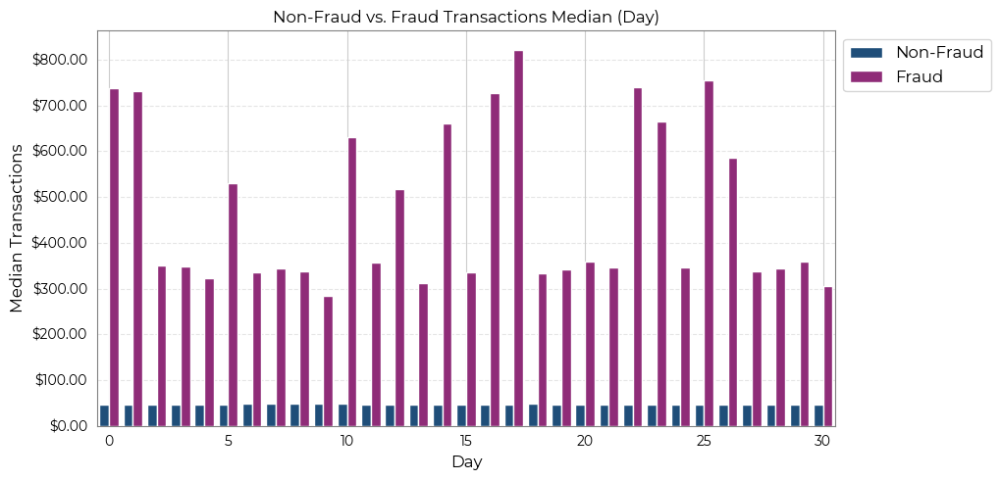

In [38]:
eda.plot_fraud_trends_same_axes(df, 'day', 'median')

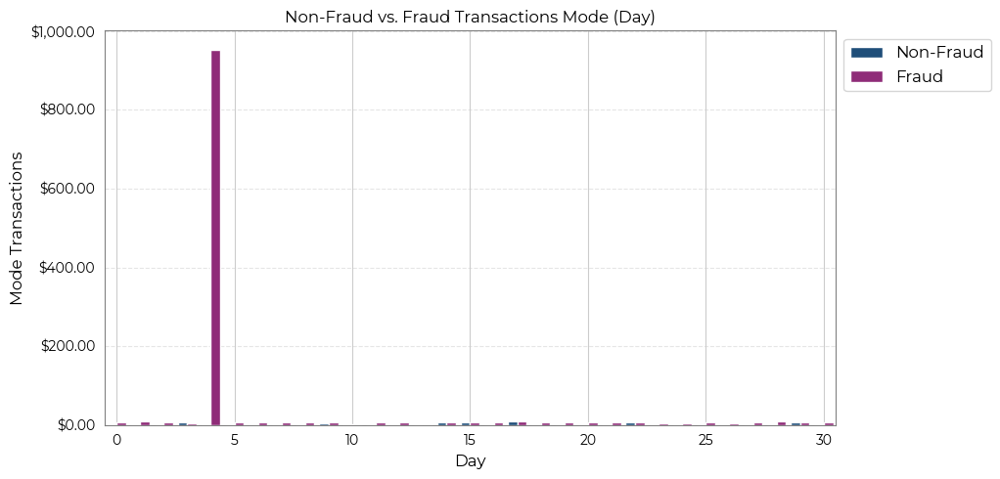

In [39]:
eda.plot_fraud_trends_same_axes(df, 'day', 'mode')

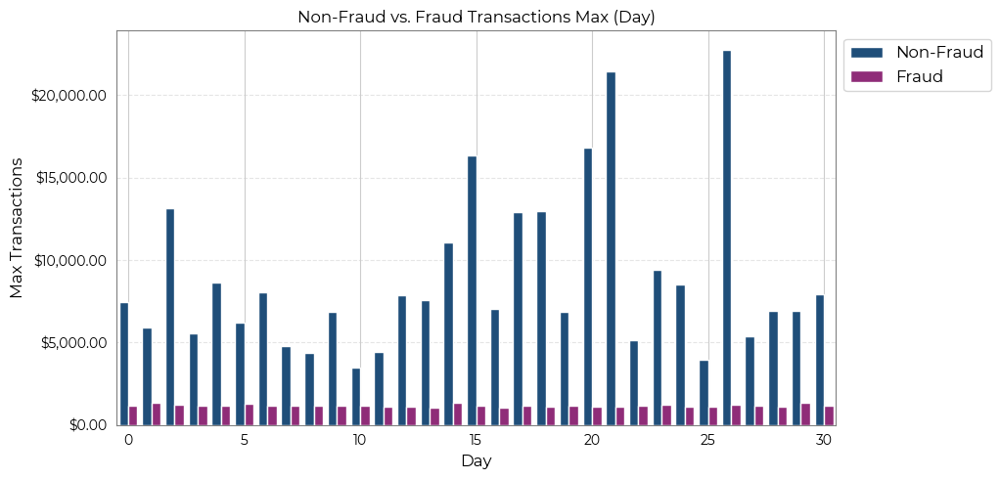

In [40]:
eda.plot_fraud_trends_same_axes(df, 'day', 'max')

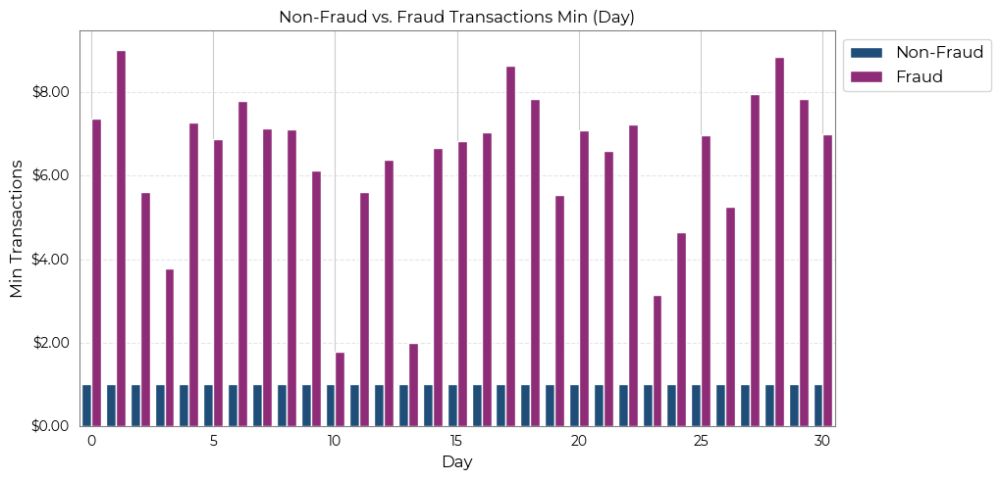

In [41]:
eda.plot_fraud_trends_same_axes(df, 'day', 'min')

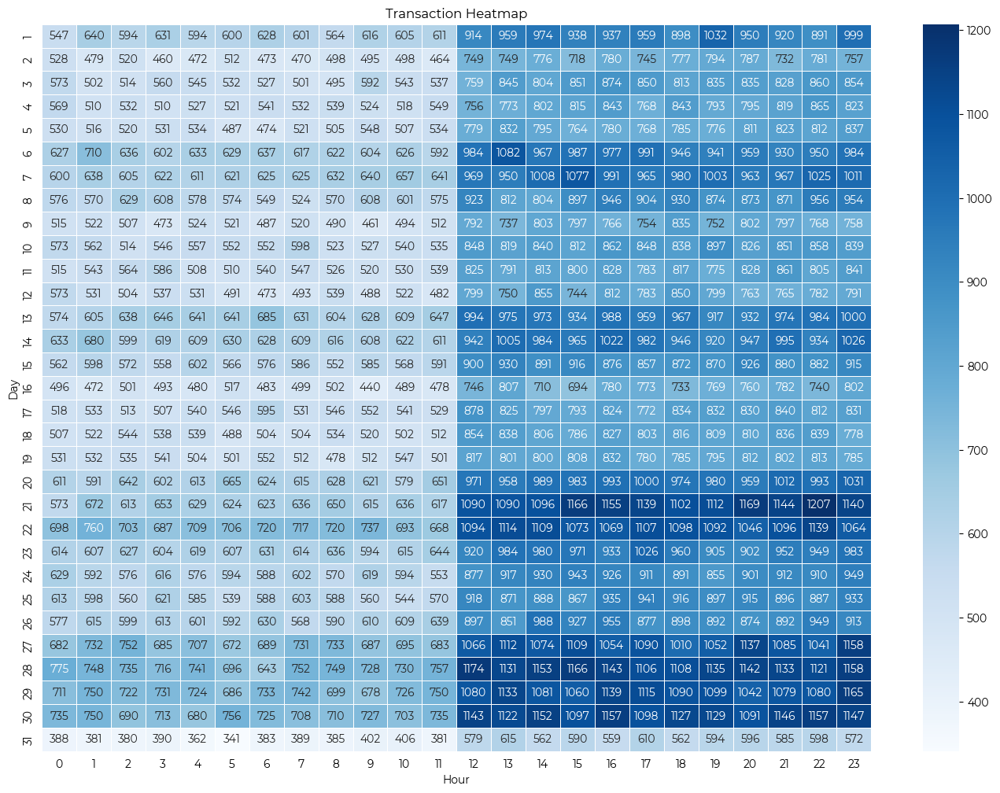

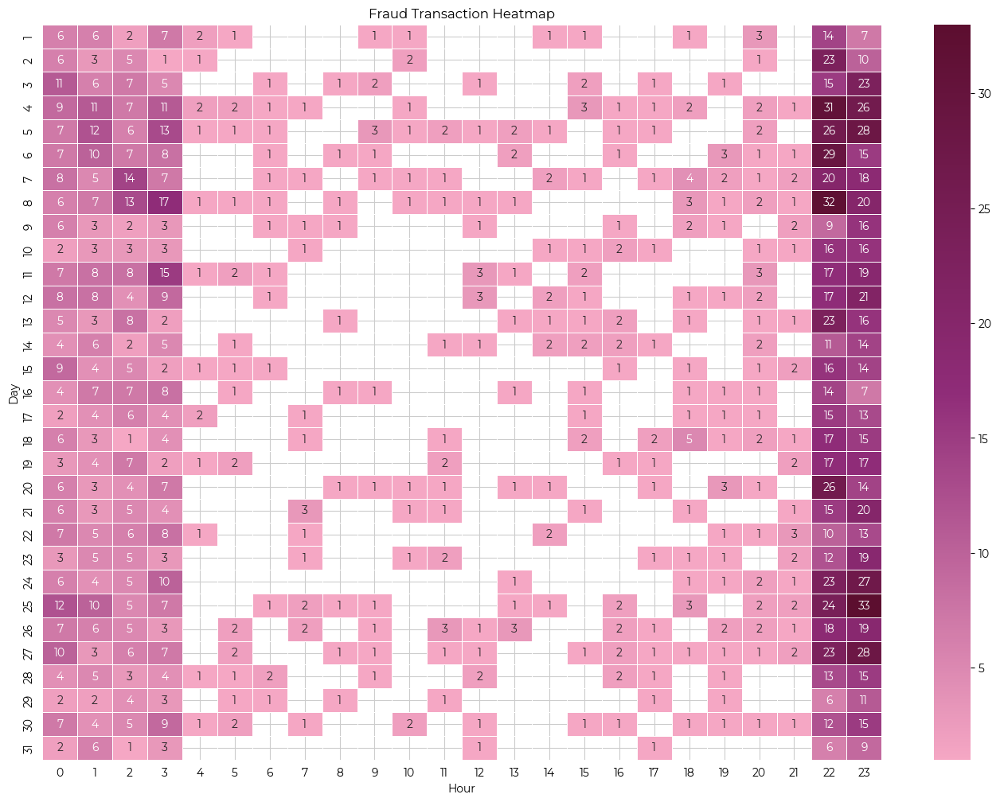

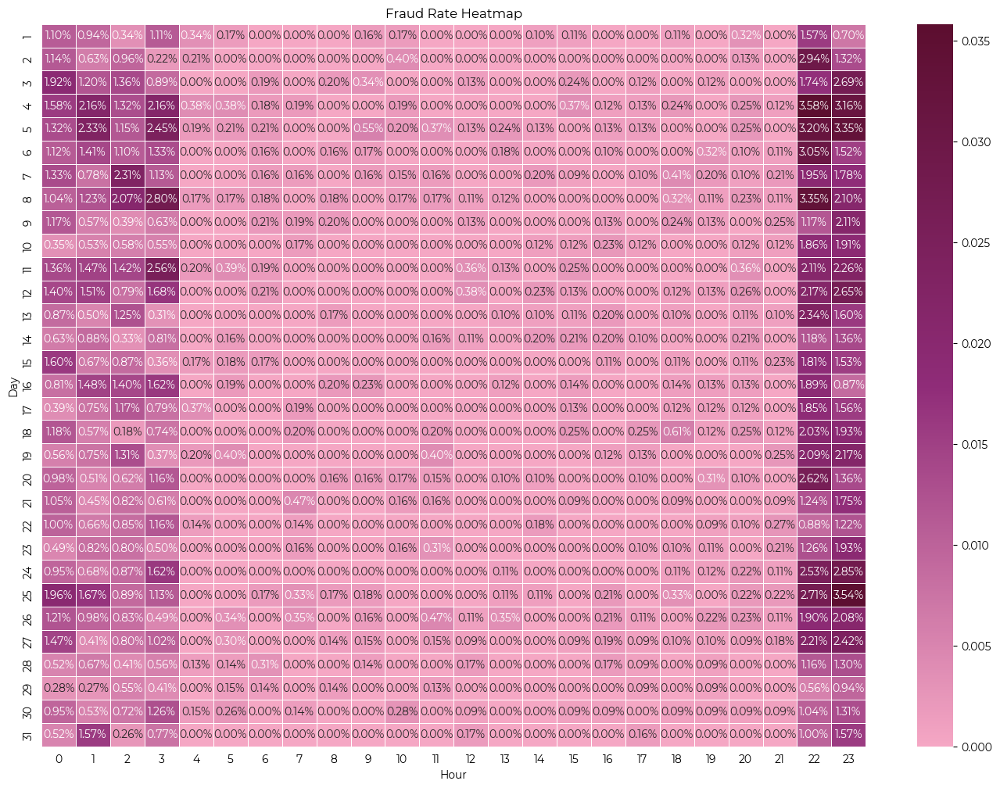

In [42]:
eda.plot_fraud_heatmap(df, 'day', 'hour')

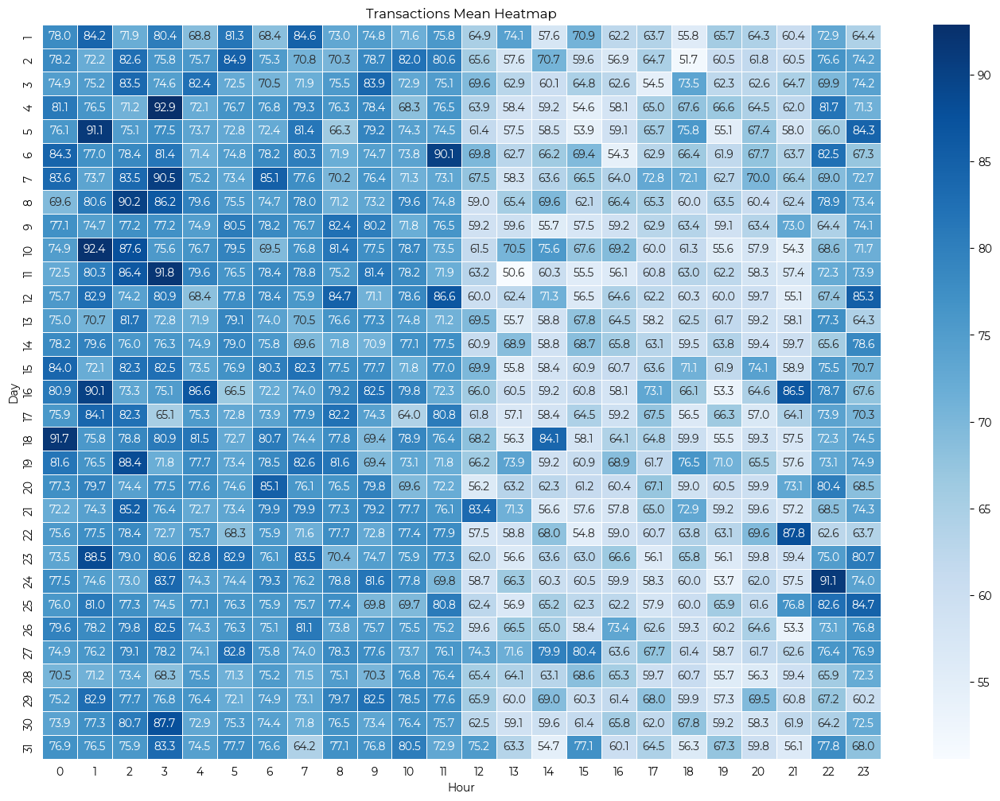

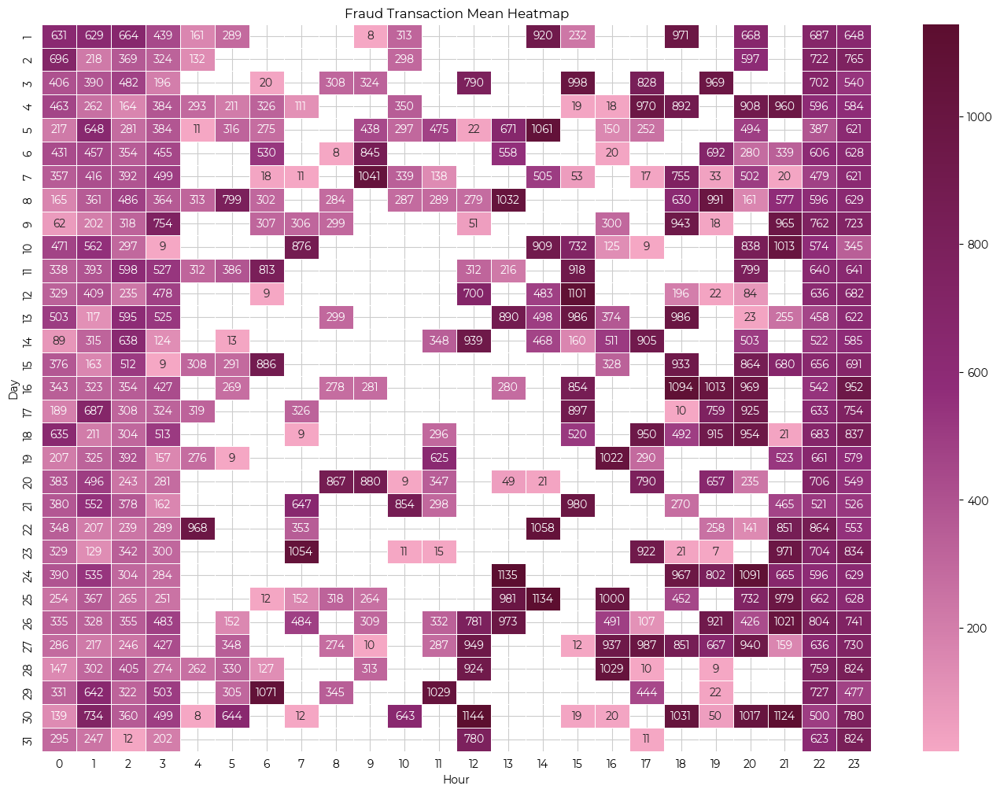

In [43]:
eda.plot_fraud_heatmap_statistic(df, 'day', 'hour','mean')

### 5. Do fraud transactions spike at certain day of the week?

In [44]:
fraud_counts = eda.fraud_trends(df, 'day_of_week')
fraud_counts

,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday
Fraud,92724,114834,109782,52574,59147,62509,62004
Non-Fraud,374,302,331,266,309,297,266


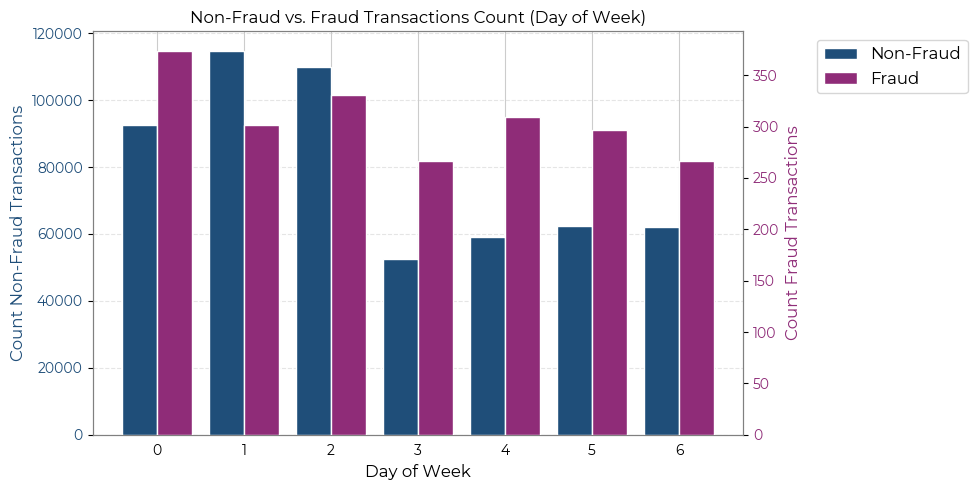

In [45]:
eda.plot_fraud_trends(df, 'day_of_week')

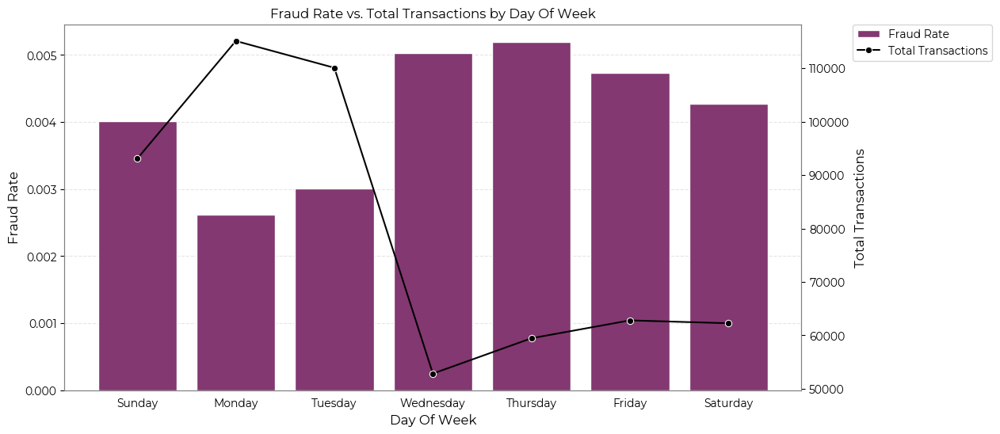

In [46]:
eda.plot_fraud_rate_by_time(df, 'day_of_week')

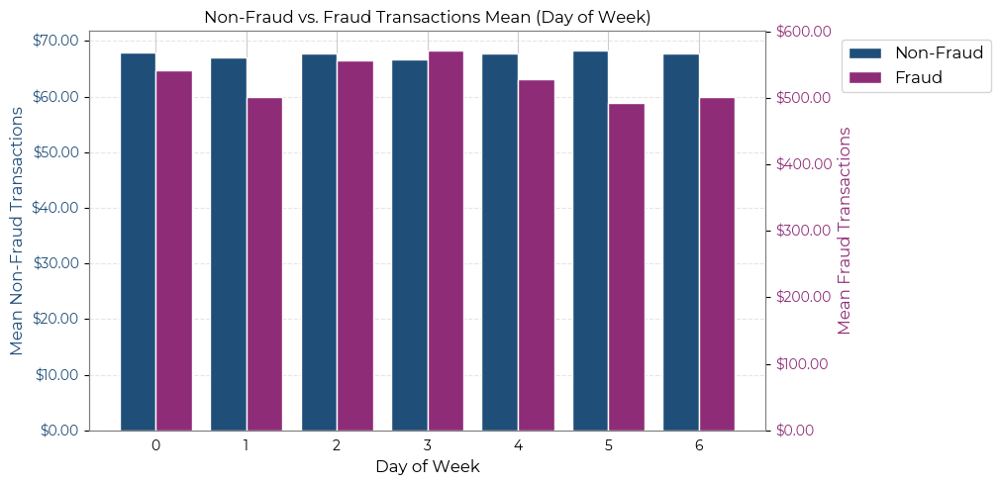

In [47]:
eda.plot_fraud_trends(df, 'day_of_week', 'mean')

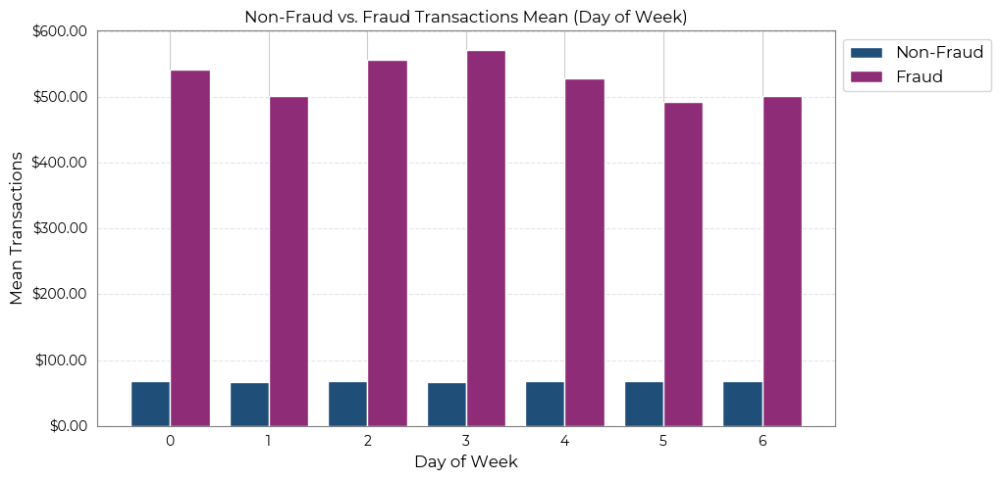

In [48]:
eda.plot_fraud_trends_same_axes(df, 'day_of_week', 'mean')

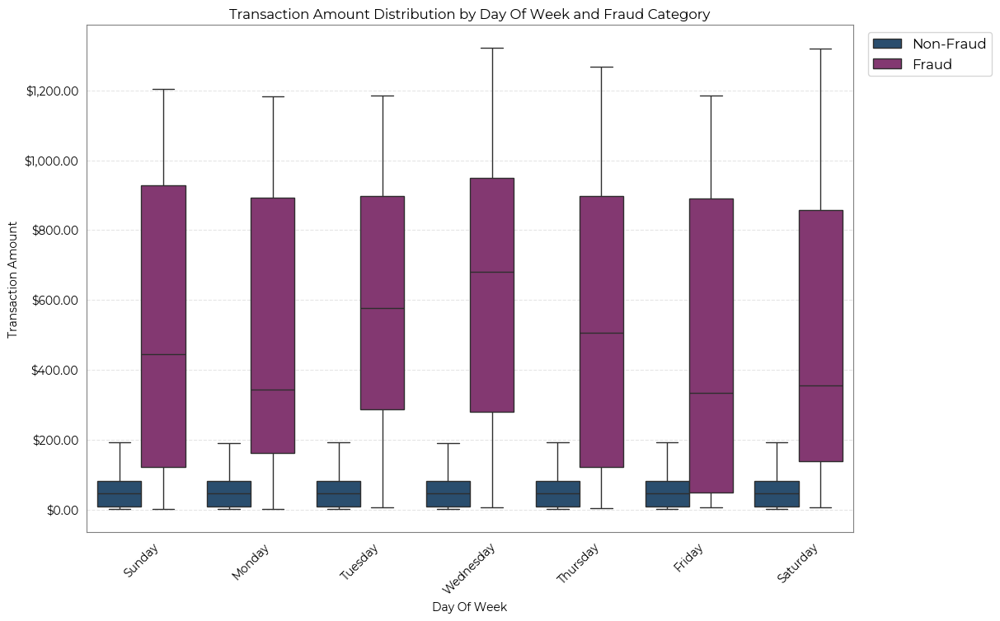

In [49]:
eda.plot_fraud_boxplots_time(df, 'day_of_week')

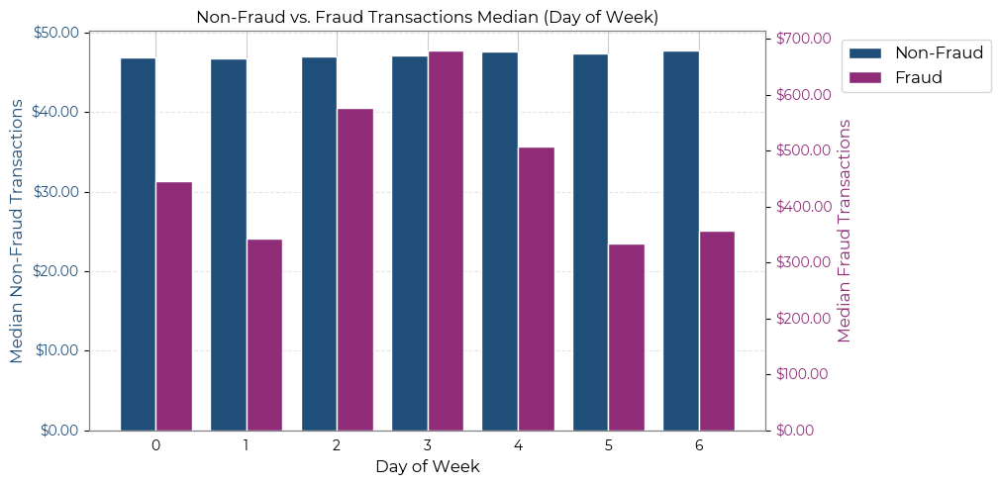

In [50]:
eda.plot_fraud_trends(df, 'day_of_week', 'median')

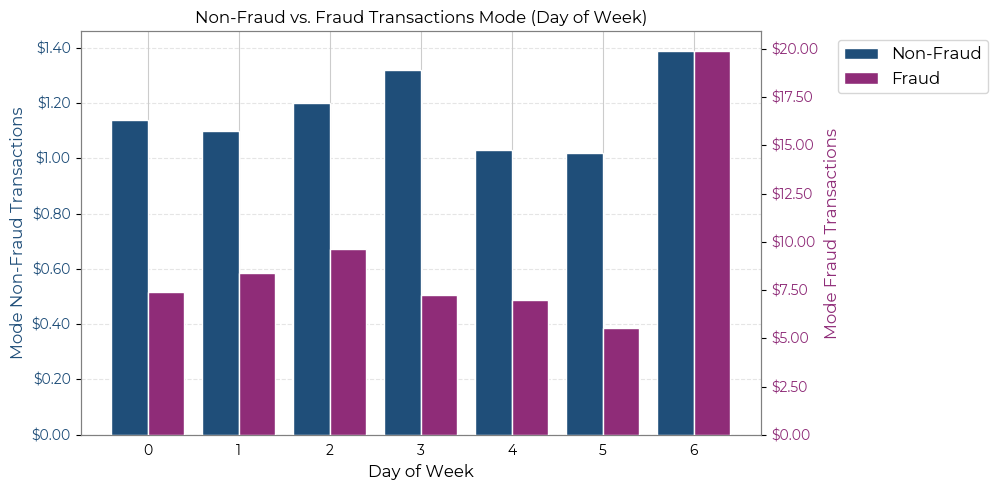

In [51]:
eda.plot_fraud_trends(df, 'day_of_week', 'mode')

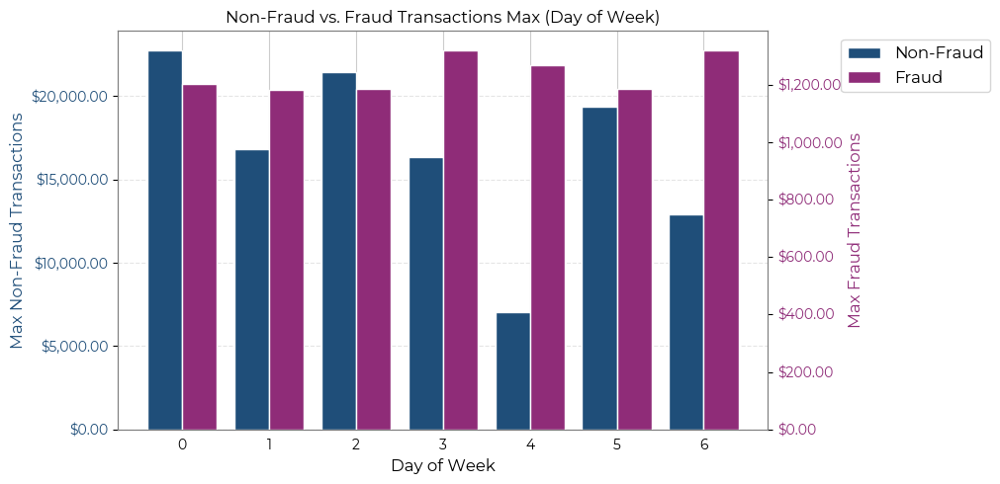

In [52]:
eda.plot_fraud_trends(df, 'day_of_week', 'max')

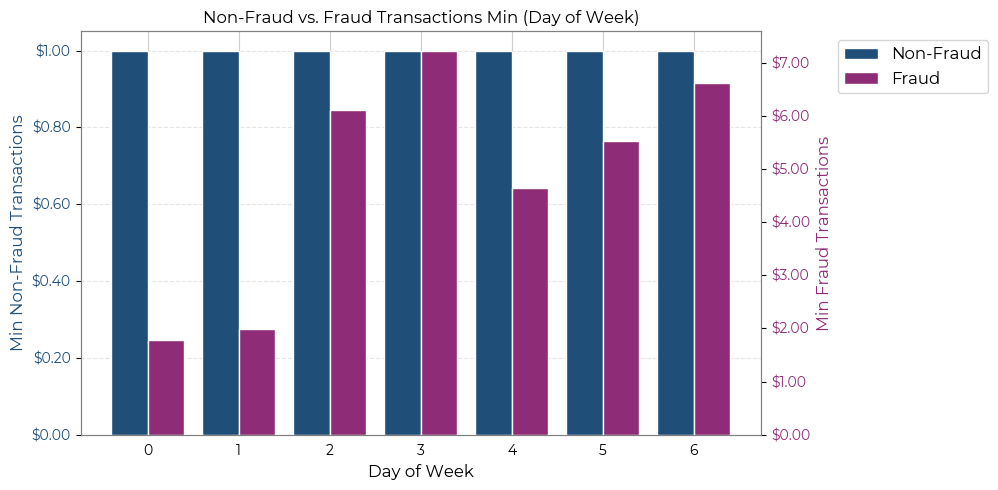

In [53]:
eda.plot_fraud_trends(df, 'day_of_week', 'min')

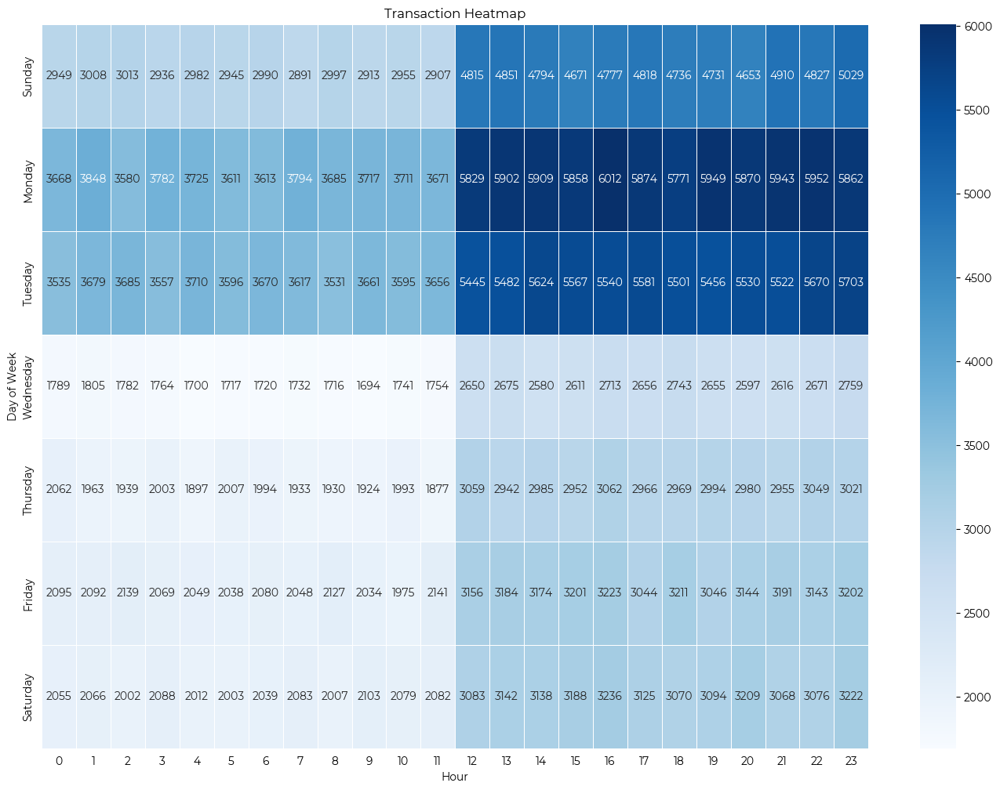

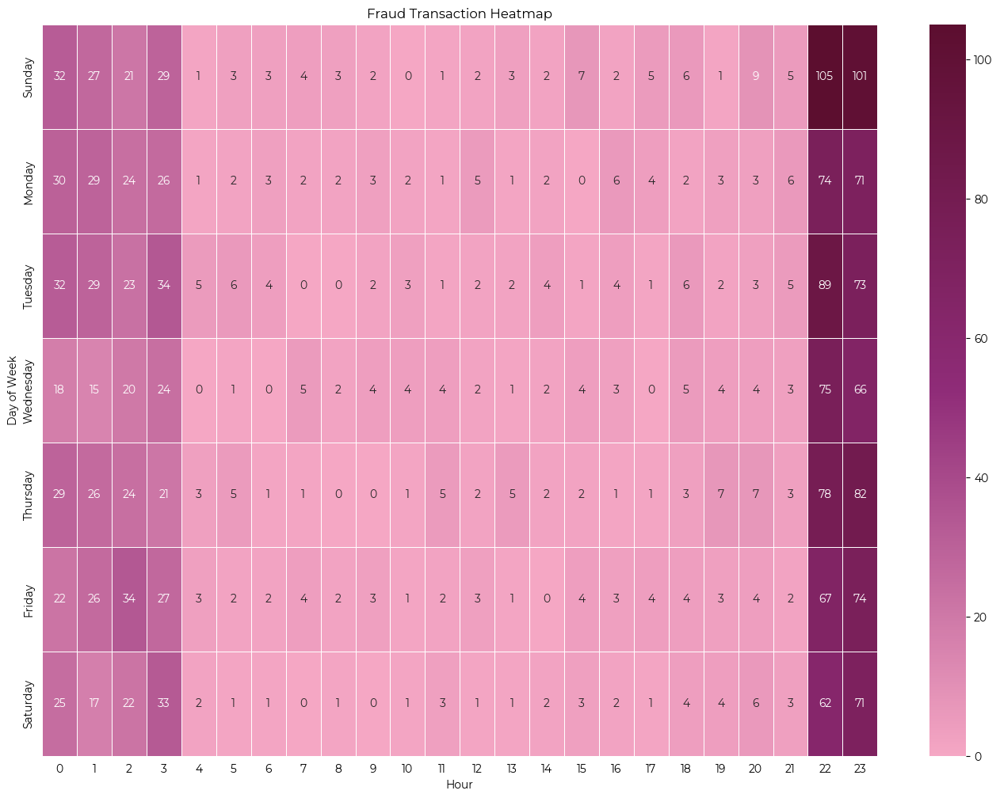

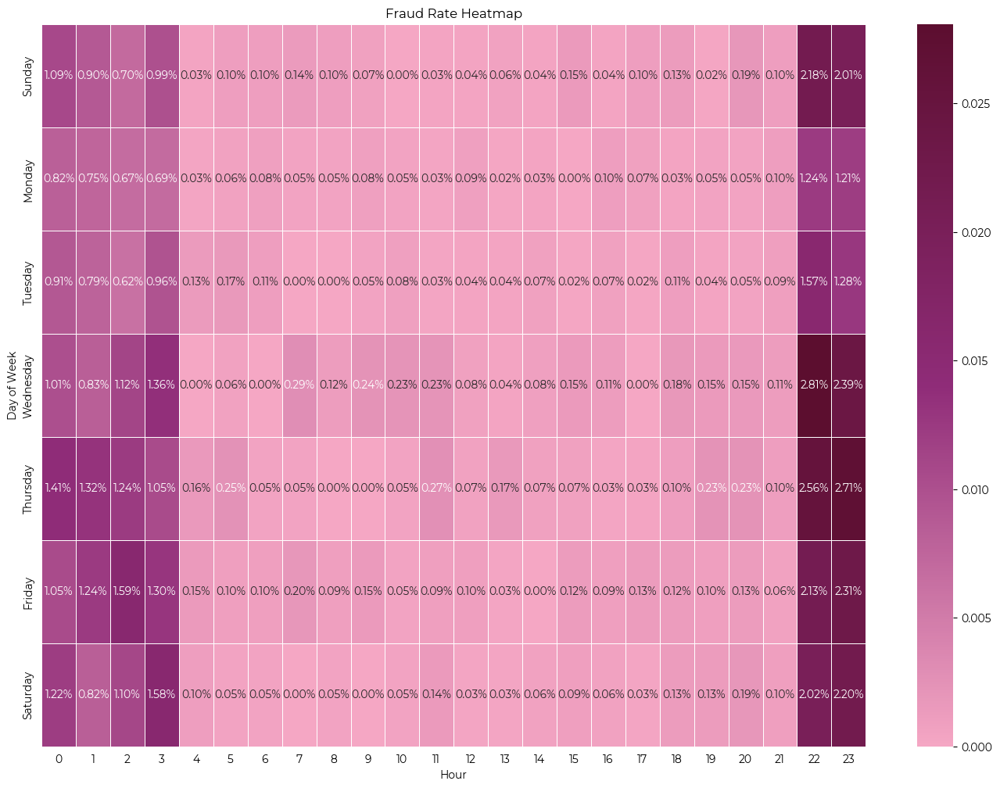

In [54]:
eda.plot_fraud_heatmap(df, 'day_of_week', 'hour')

In [55]:
# Chi-square tests to test the independence of time and hour in the fraud rates
crosstab_result =  pd.crosstab(df[df['is_fraud'] == 1]['hour'], df[df['is_fraud'] == 1]['day_of_week'])
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result)
chi2_pvalue

# A p-value > 0.05, indicates that there is not enough evidence to conclude a significant association between the variables.

np.float64(0.40551342498190135)

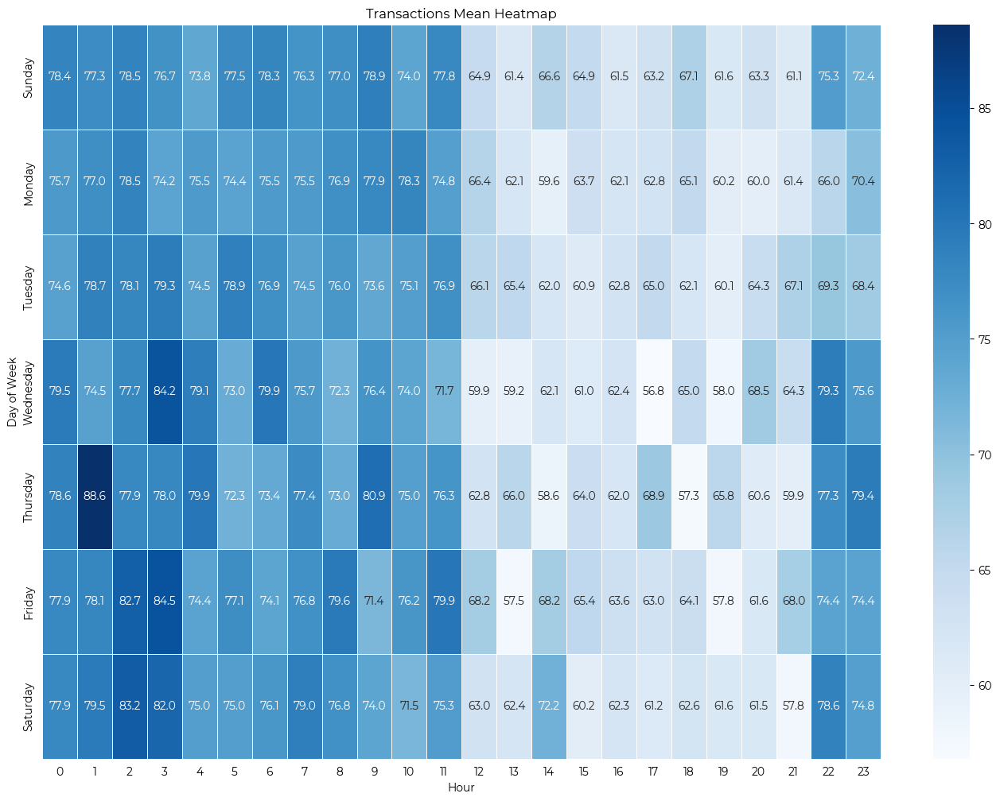

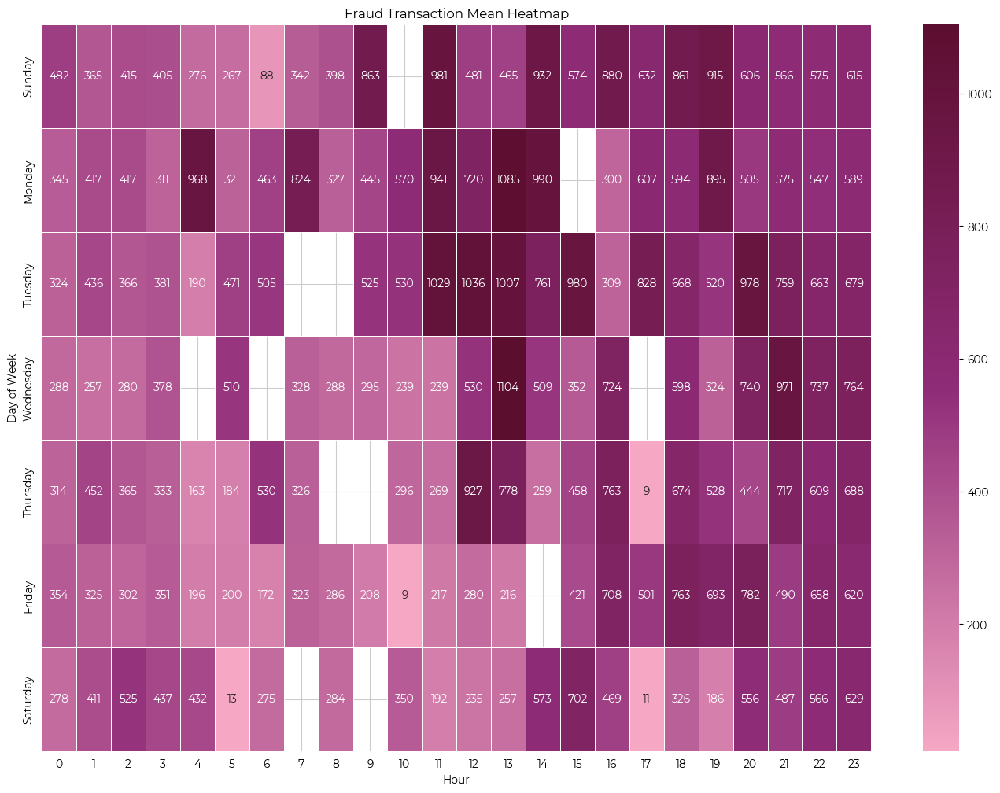

In [56]:
eda.plot_fraud_heatmap_statistic(df, 'day_of_week', 'hour','mean')

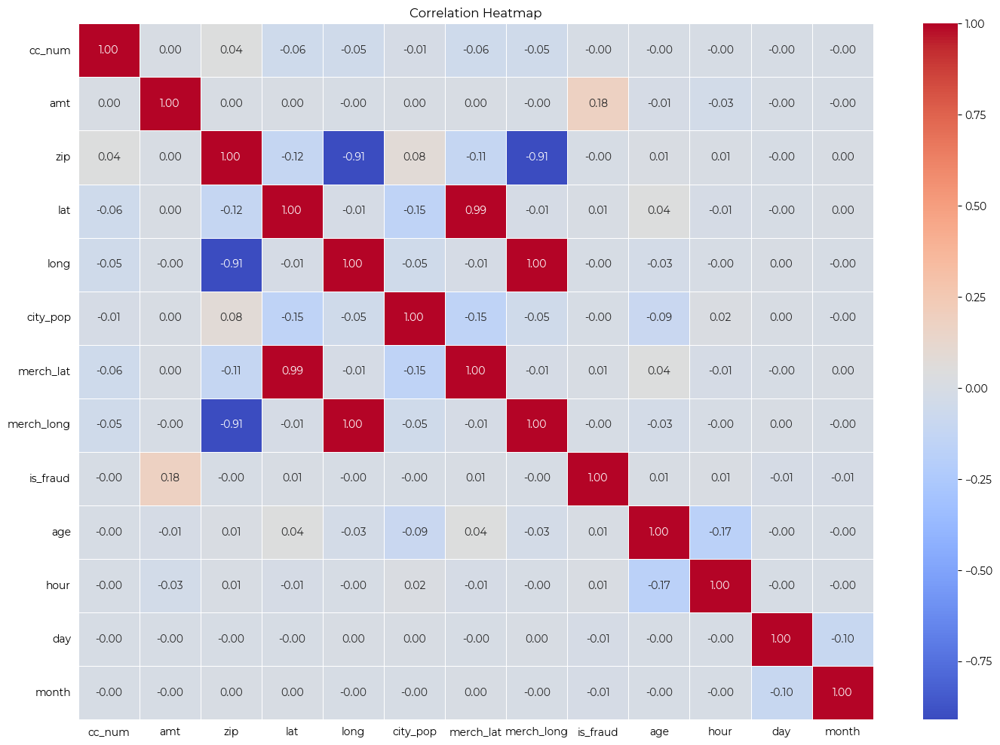

In [57]:
# Correlation matrix to visualizes correlation coefficients between pairs of continuous variables using color gradients.
eda.plot_correlation_heatmap(df)

### 6.  Are there seasonal trends in fraud?

In [58]:
fraud_counts = eda.fraud_trends(df, 'month')
fraud_counts

,6,7,8,9,10,11,12
Fraud,29925,85527,88344,69193,68964,72341,139280
Non-Fraud,133,321,415,340,384,294,258


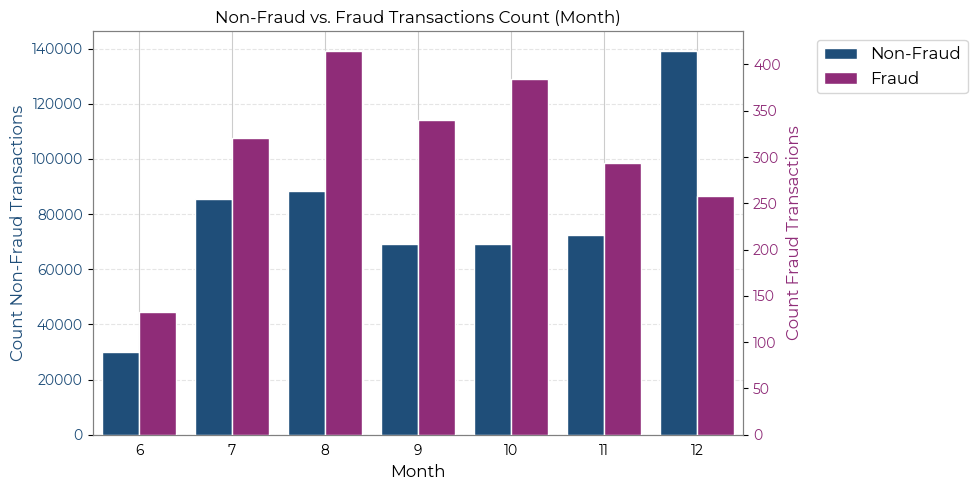

In [59]:
eda.plot_fraud_trends(df, 'month')

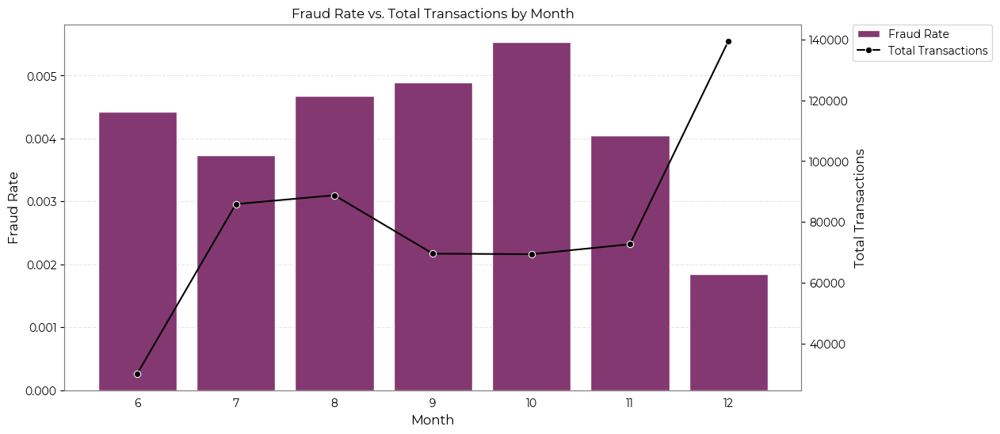

In [60]:
eda.plot_fraud_rate_by_time(df, 'month')

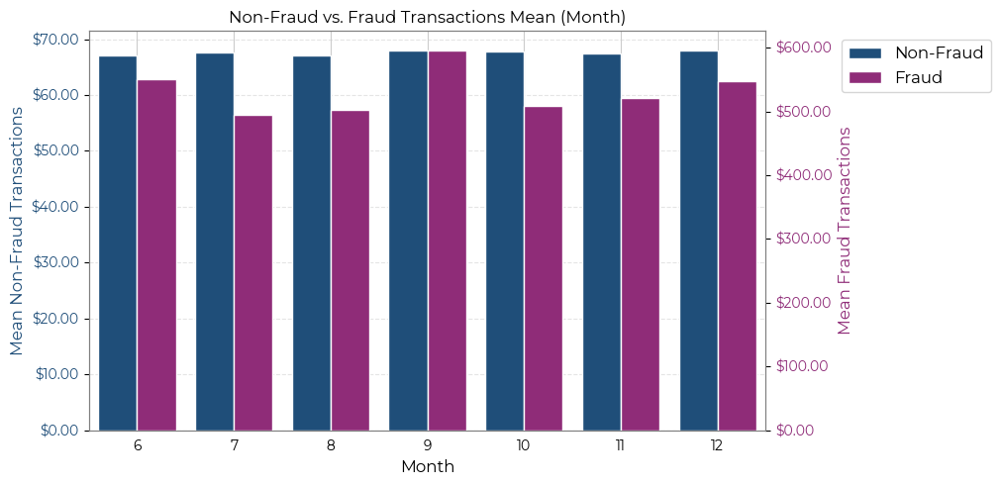

In [61]:
eda.plot_fraud_trends(df, 'month', 'mean')

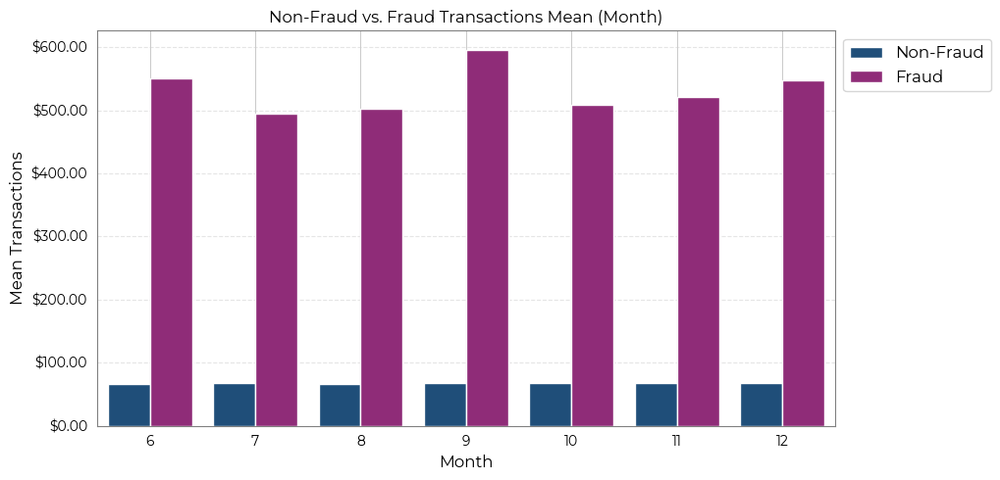

In [62]:
eda.plot_fraud_trends_same_axes(df, 'month', 'mean')

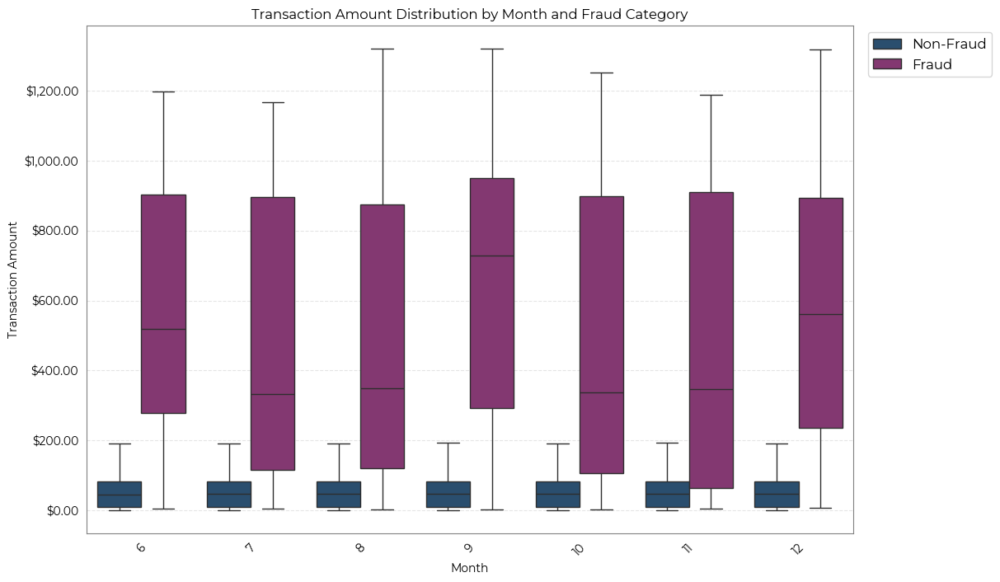

In [63]:
eda.plot_fraud_boxplots_time(df, 'month')

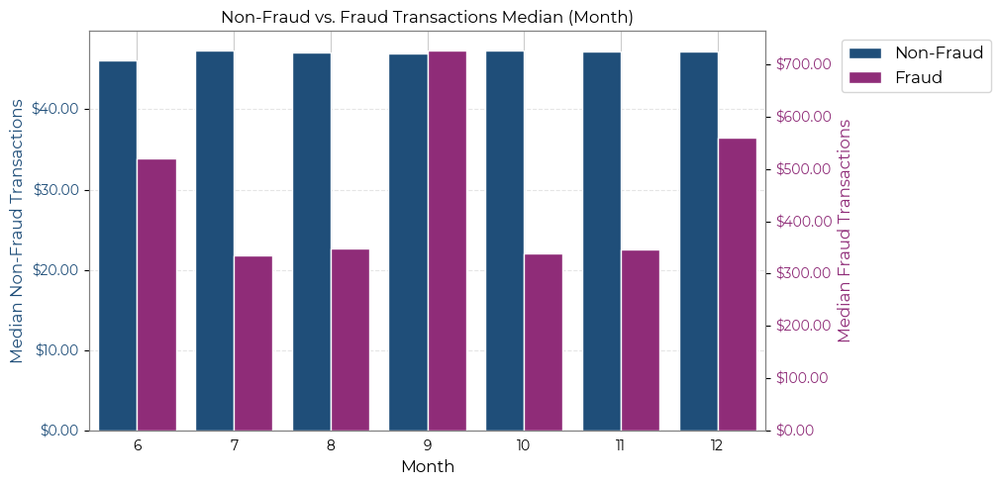

In [64]:
eda.plot_fraud_trends(df, 'month', 'median')

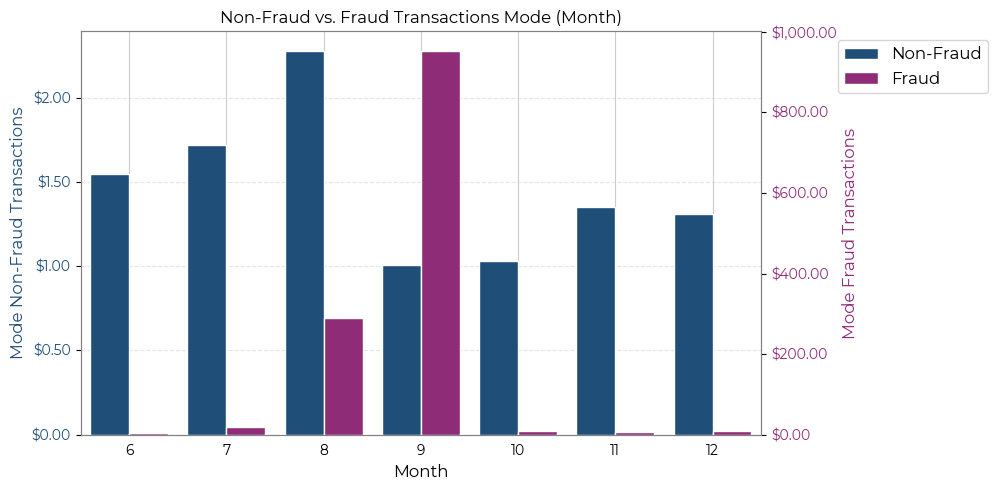

In [65]:
eda.plot_fraud_trends(df, 'month', 'mode')

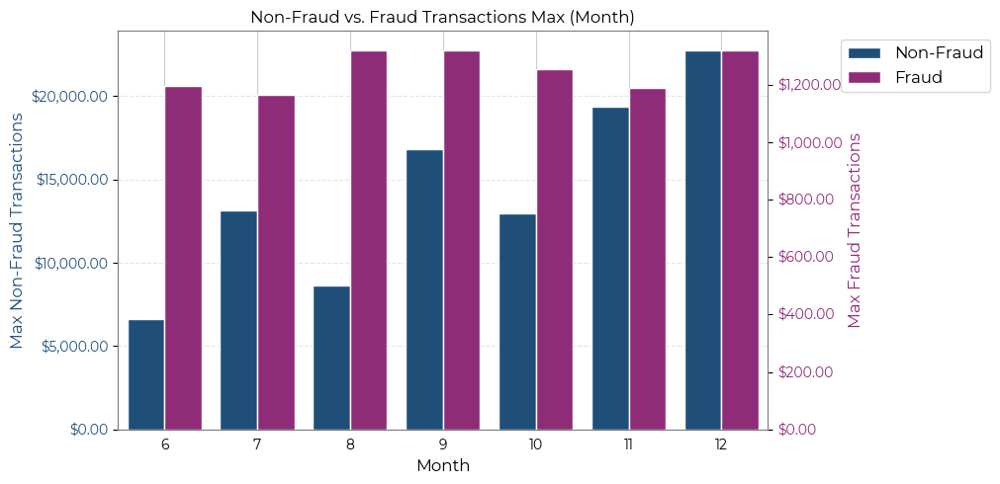

In [66]:
eda.plot_fraud_trends(df, 'month', 'max')

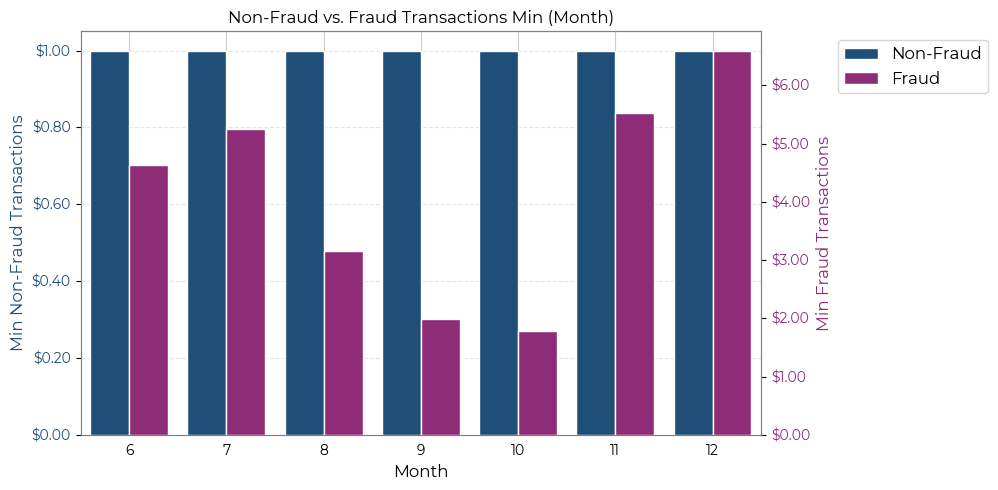

In [67]:
eda.plot_fraud_trends(df, 'month', 'min')

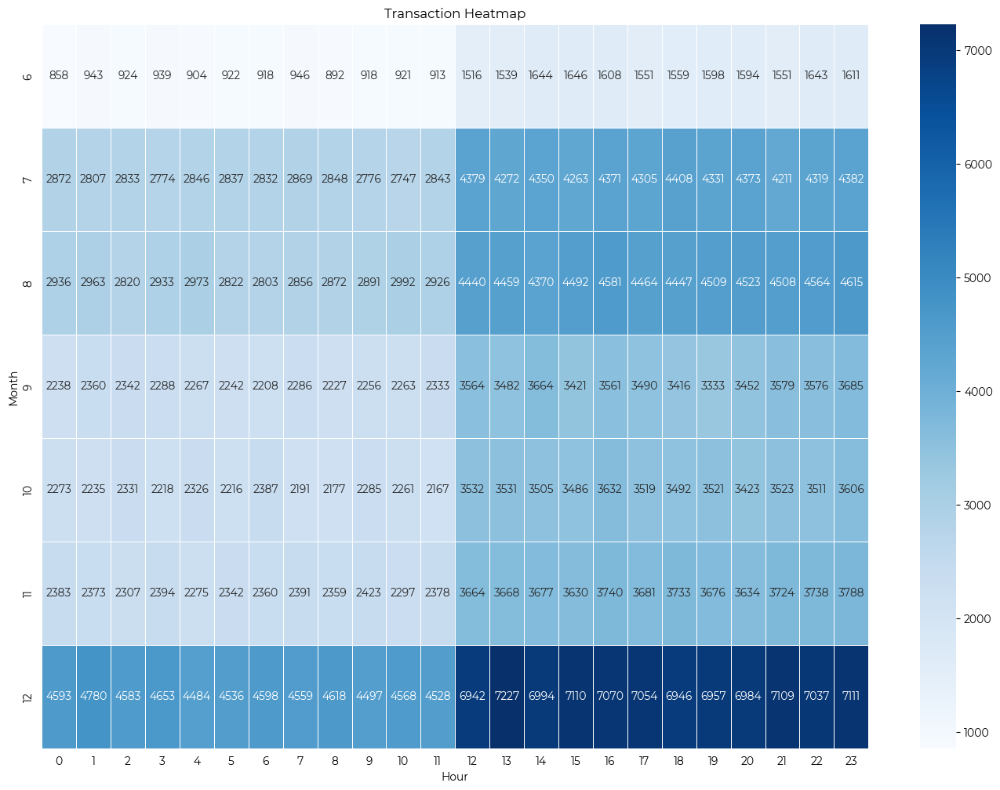

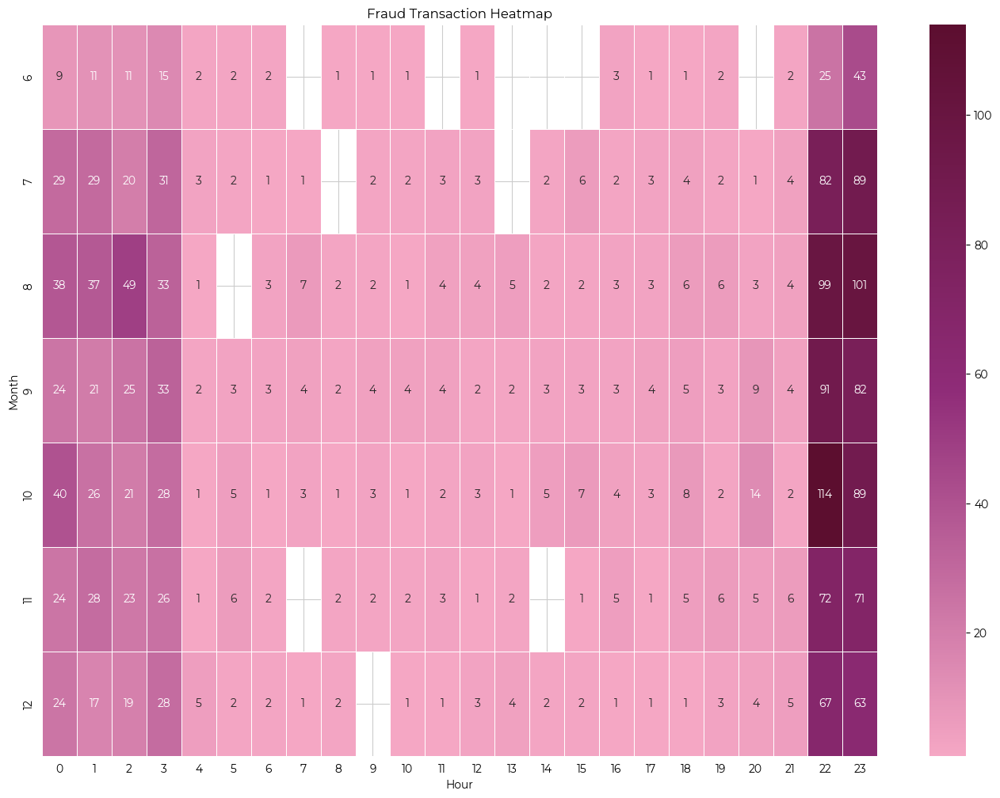

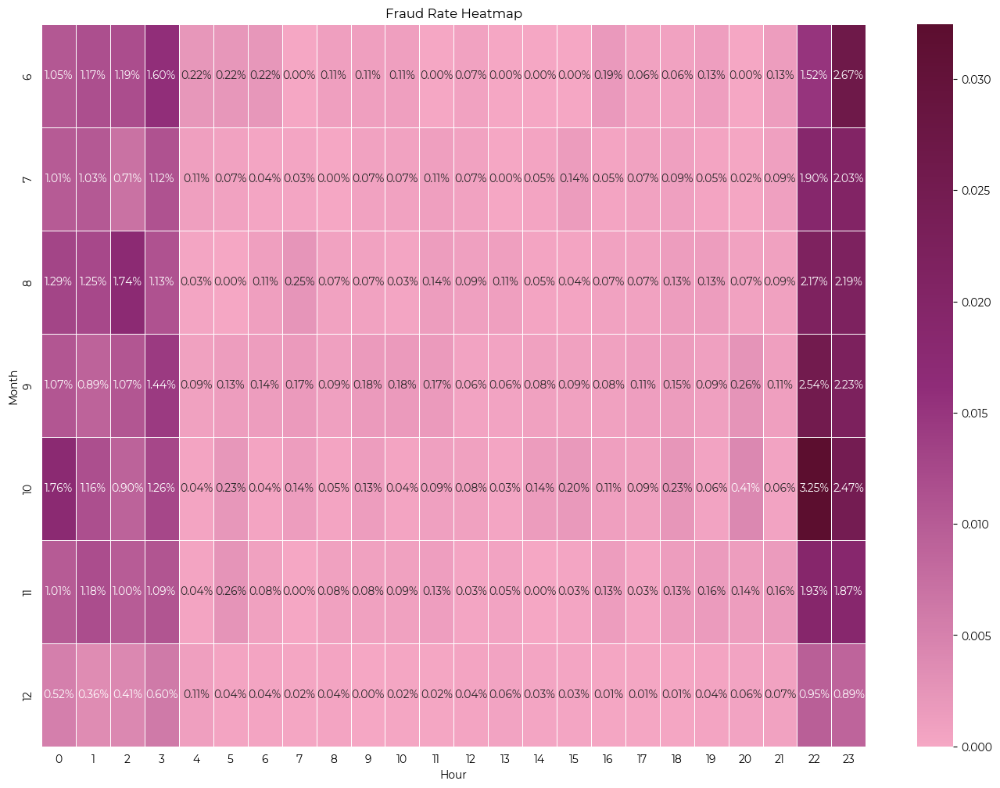

In [68]:
eda.plot_fraud_heatmap(df, 'month', 'hour')

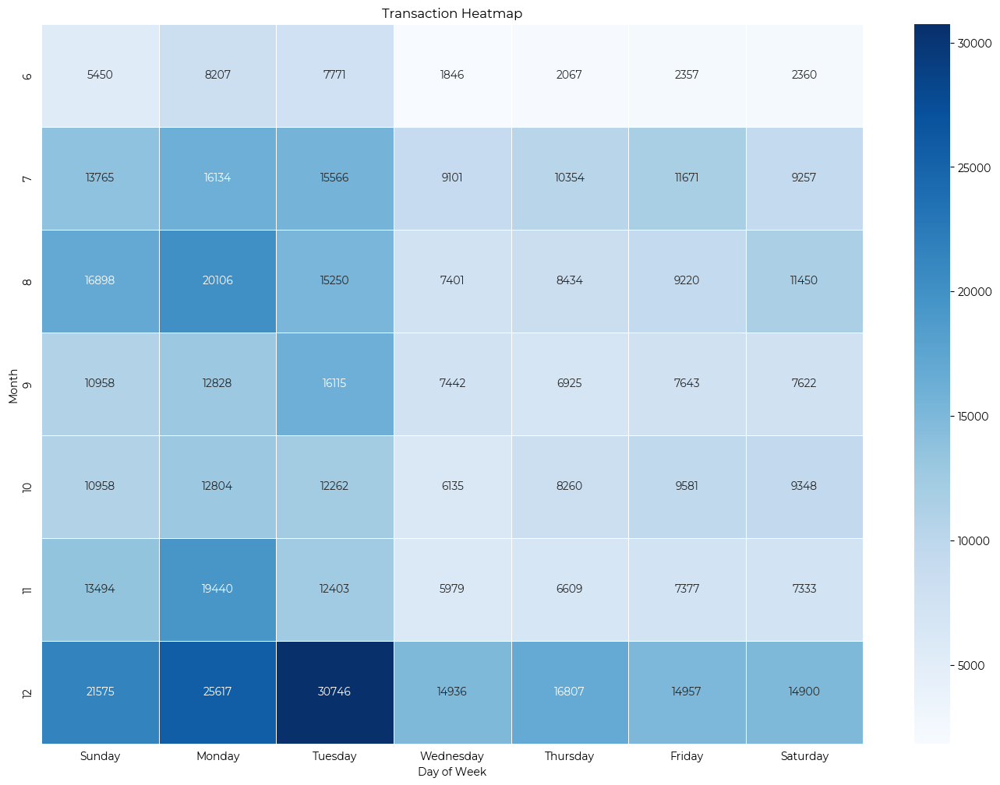

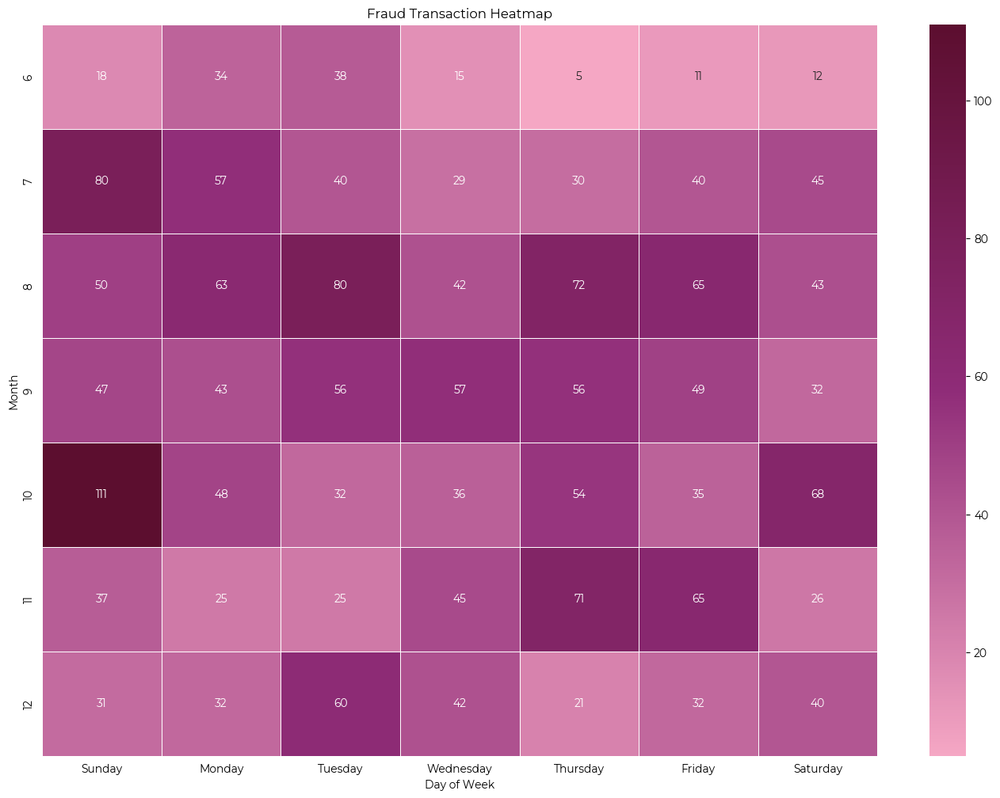

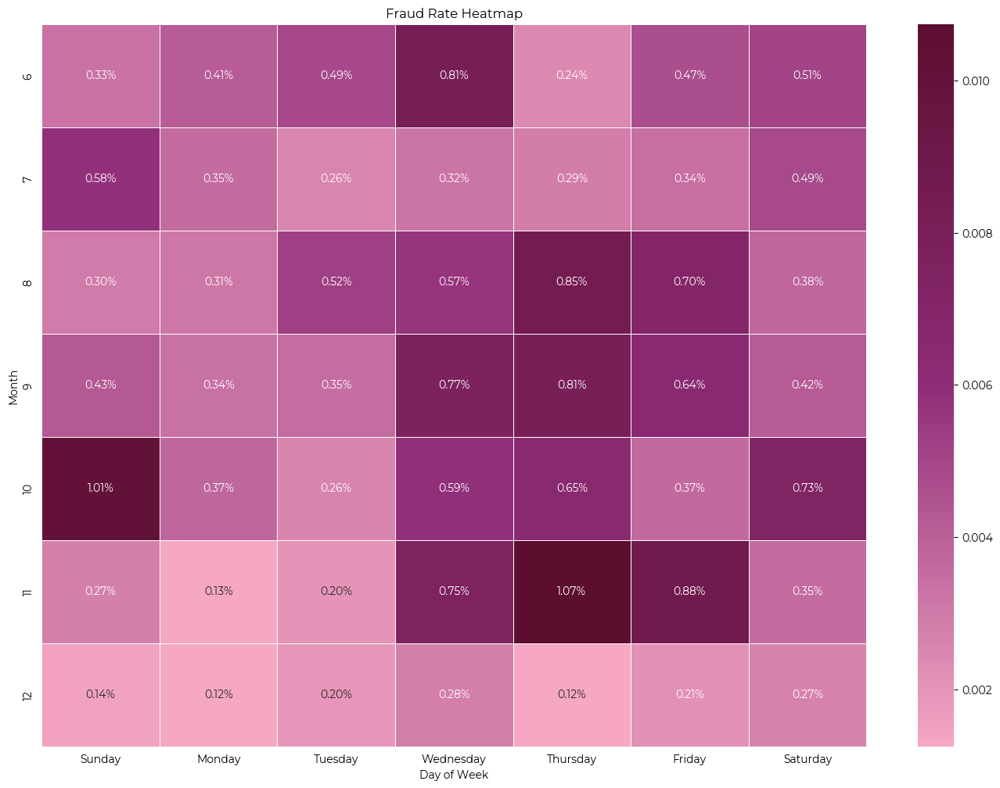

In [69]:
eda.plot_fraud_heatmap(df, 'month', 'day_of_week')

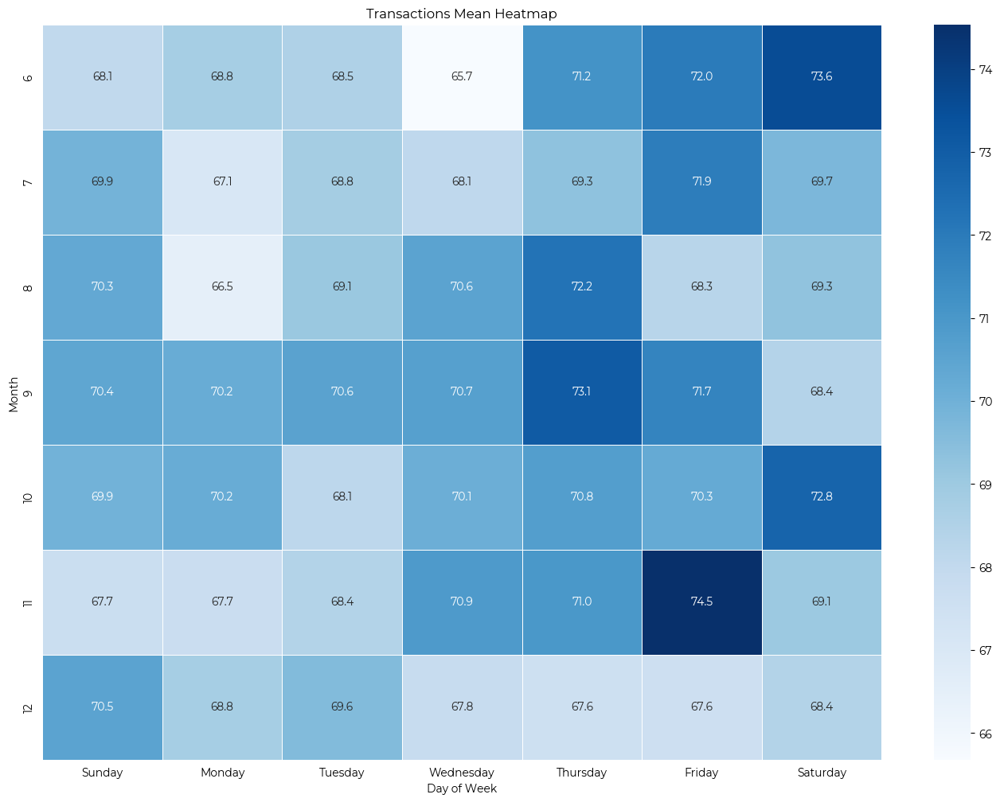

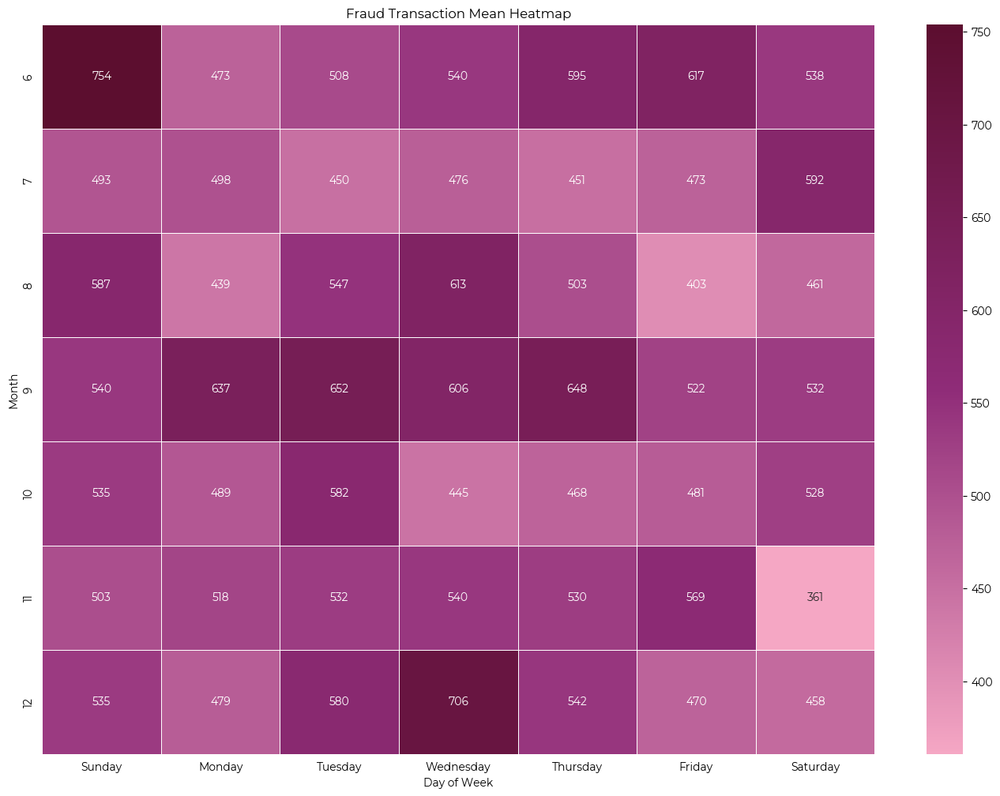

In [70]:
eda.plot_fraud_heatmap_statistic(df, 'month', 'day_of_week', 'mean')

##  Risky Transaction Types

### 7. What merchant category have the highest fraud rates?

In [71]:
stats_df = eda.create_fraud_statistics_table(df)
stats_df

Mean               Median            mode          \
is_fraud                 0           1        0        1      0       1   
category                                                                  
Entertainment    63.328052  509.765593   50.970  507.070   1.02  334.92   
Food Dining      50.679363  122.361852   41.705  121.825   1.72  118.24   
Gas Transport    63.718286   12.002727   62.970   10.510  59.69    7.84   
Grocery Net      53.820633   11.668049   50.960   11.430  38.27    5.60   
Grocery Pos     114.048069  313.127258  104.450  312.190  94.70  284.76   
Health Fitness   53.915020   20.352308   42.715   19.825  73.95   20.33   
Home             57.739577  257.616418   48.120  254.250   3.50  168.06   
Kids Pets        57.557286   19.822308   47.070   19.910  53.01   19.44   
Misc Net         71.450544  804.280712    9.820  801.340   1.08  586.09   
Misc Pos         61.908444  193.386389   14.245    9.575   1.26    6.67   
Personal Care    48.272806   25.920571   33.100   21.295   1.07   21.87   
Shopping Net     72.314977  994.316067    8.290  992.100   2.07  941.23   
Shopping Pos     73.382778  886.794601    7.720  874.710   1.10  951.91   
Travel          112.627928    8.699500    6.180    9.185   2.67   10.18   

                  Min               Max              Std Dev              \
is_fraud            0       1         0        1           0           1   
category                                                                   
Entertainment    1.00  334.92    801.44   669.67   61.891119   73.526163   
Food Dining      1.00   93.87    544.27   149.53   48.406649   14.219896   
Gas Transport   18.20    5.53    147.11    23.69   15.615935    4.710715   
Grocery Net      1.07    5.60    178.44    19.92   22.850265    3.230280   
Grocery Pos     10.74  241.45    290.88   392.00   48.063453   26.516657   
Health Fitness   1.00   16.52    594.17    26.34   47.982573    2.340748   
Home             1.00  168.06    507.05   422.31   47.552386   47.022282   
Kids Pets        1.01    3.15    555.05    24.16   48.761462    2.770954   
Misc Net         1.00  586.09   2802.29  1039.88  147.404451   86.714744   
Misc Pos         1.00    6.67   4800.65   913.04  133.224518  315.827322   
Personal Care    1.00   15.99    521.87    53.26   49.443450   11.939247   
Shopping Net     1.00  723.15   6852.36  1267.18  215.771245   94.799623   
Shopping Pos     1.00  592.56   7320.86  1320.92  226.666515  130.800797   
Travel           1.00    1.78  22768.11    11.83  596.609821    2.322389   

                Count       
is_fraud            0    1  
category                    
Entertainment   40045   59  
Food Dining     39214   54  
Gas Transport   56216  154  
Grocery Net     19385   41  
Grocery Pos     52068  485  
Health Fitness  36622   52  
Home            52278   67  
Kids Pets       48627   65  
Misc Net        27100  267  
Misc Pos        34502   72  
Personal Care   39257   70  
Shopping Net    41273  506  
Shopping Pos    49578  213  
Travel          17409   40

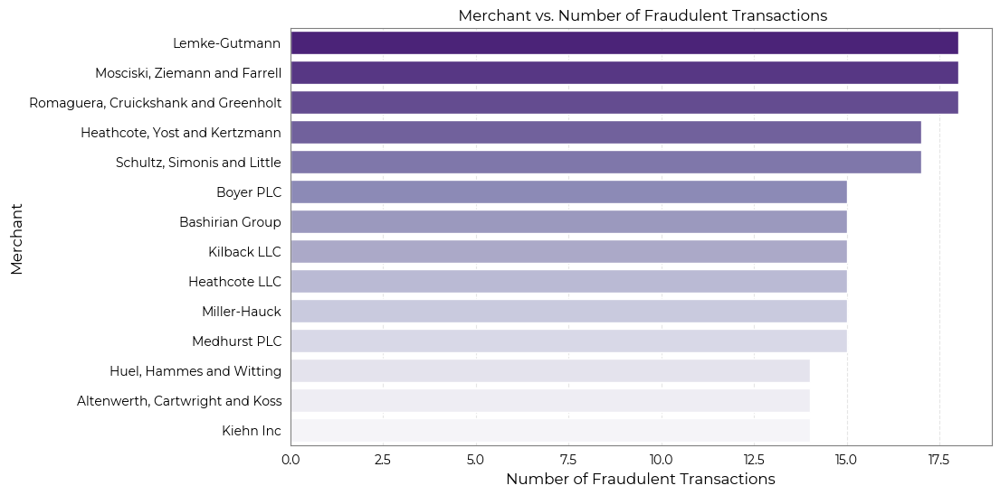

In [72]:
eda.plot_high_risk_transaction_types(df, 'merchant')

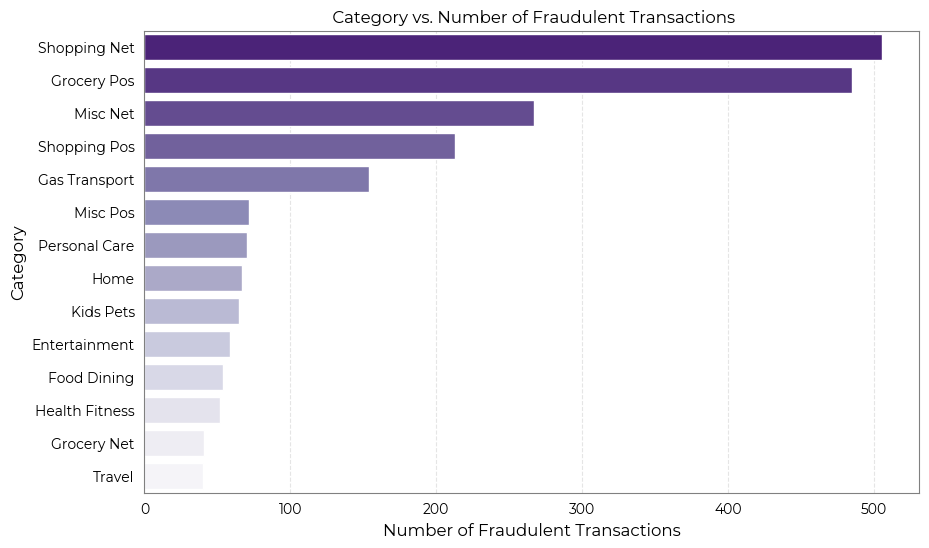

In [73]:
eda.plot_high_risk_transaction_types(df, 'category')

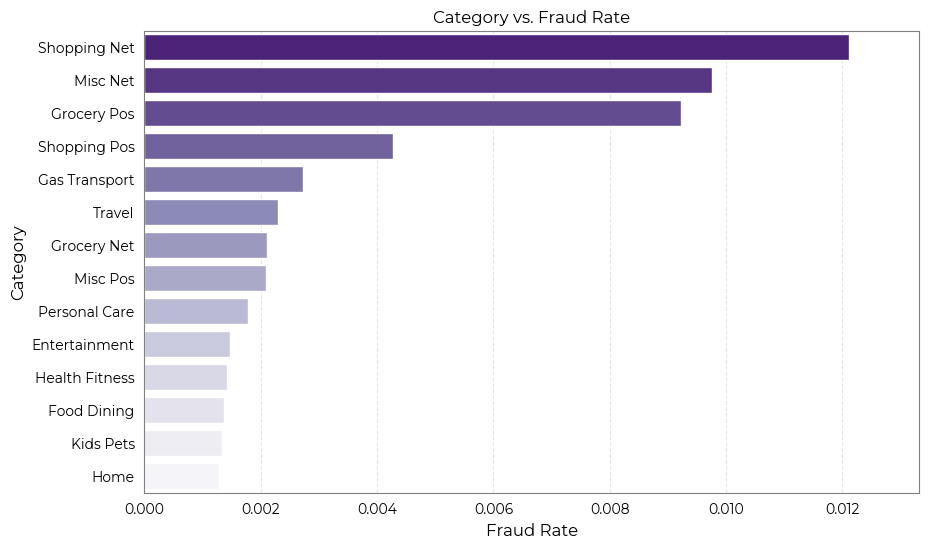

In [74]:
eda.plot_high_risk_transaction_types_fre(df, 'category')

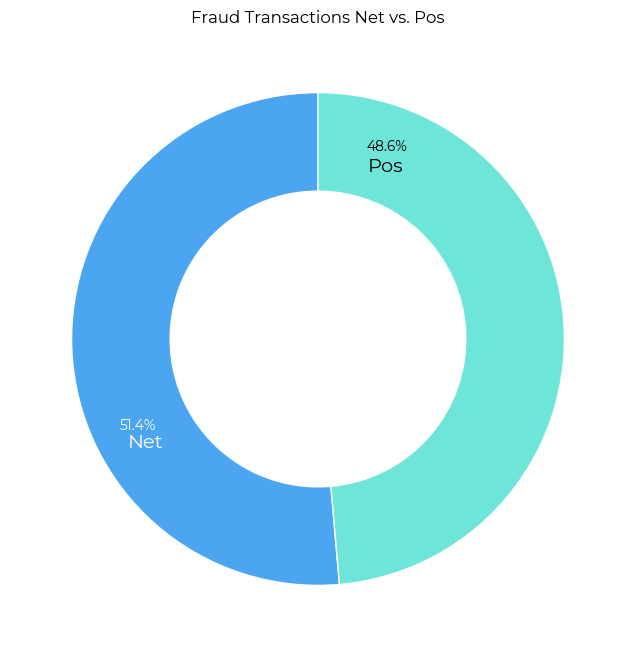

In [75]:
fraud_counts = eda.plot_donut_histogram_by_net_pos_fraud_only(df, 'category')
fraud_counts

### 8. How do fraud and non-fraud transactions compare across merchant categories?

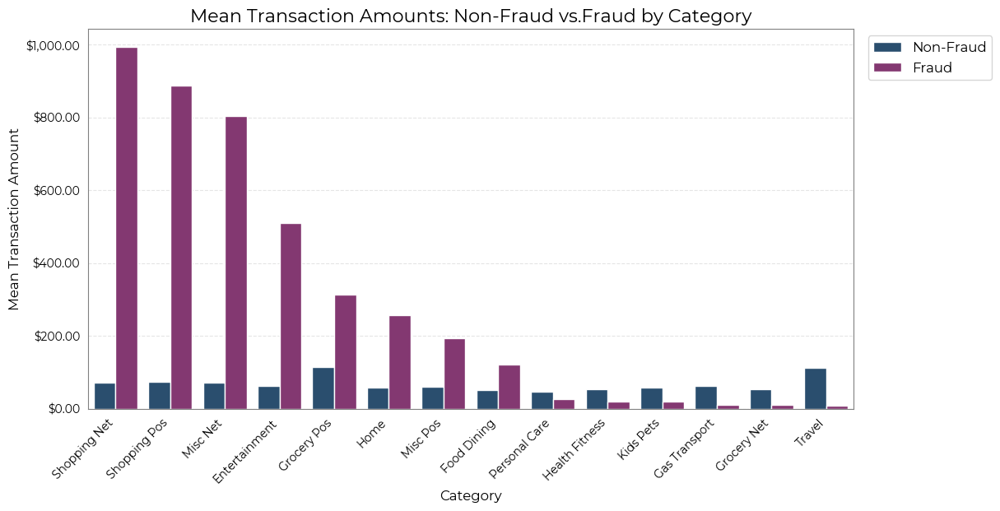

In [76]:
eda.plot_fraud_vs_nonfraud_means(df, 'category')

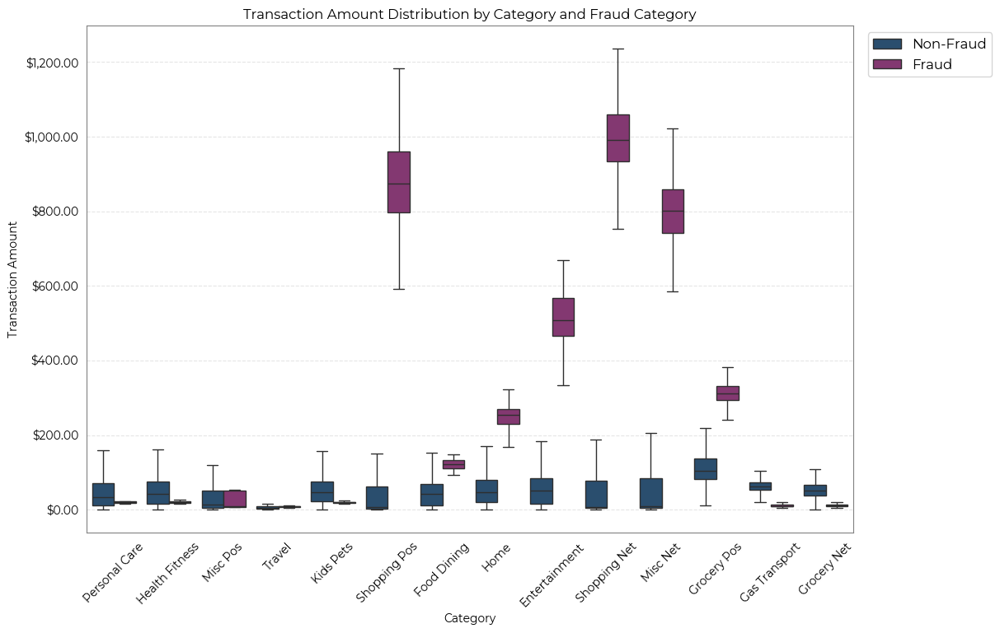

In [77]:
eda.plot_fraud_boxplots_time(df, 'category')

### 9. When do fraud transactions occur most often in each category?

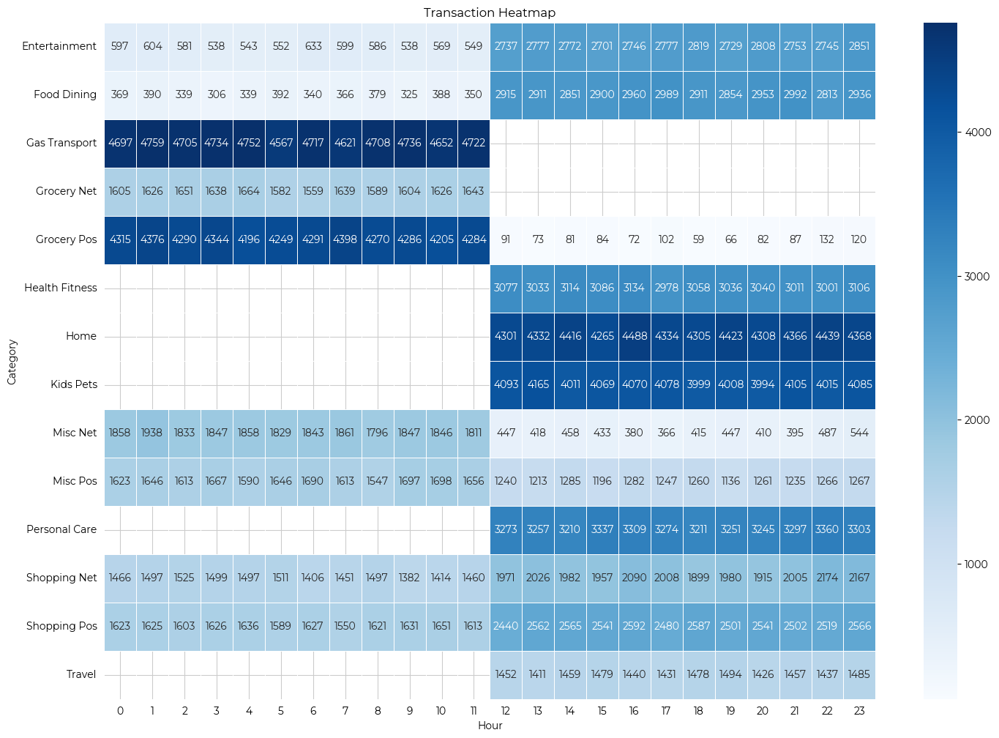

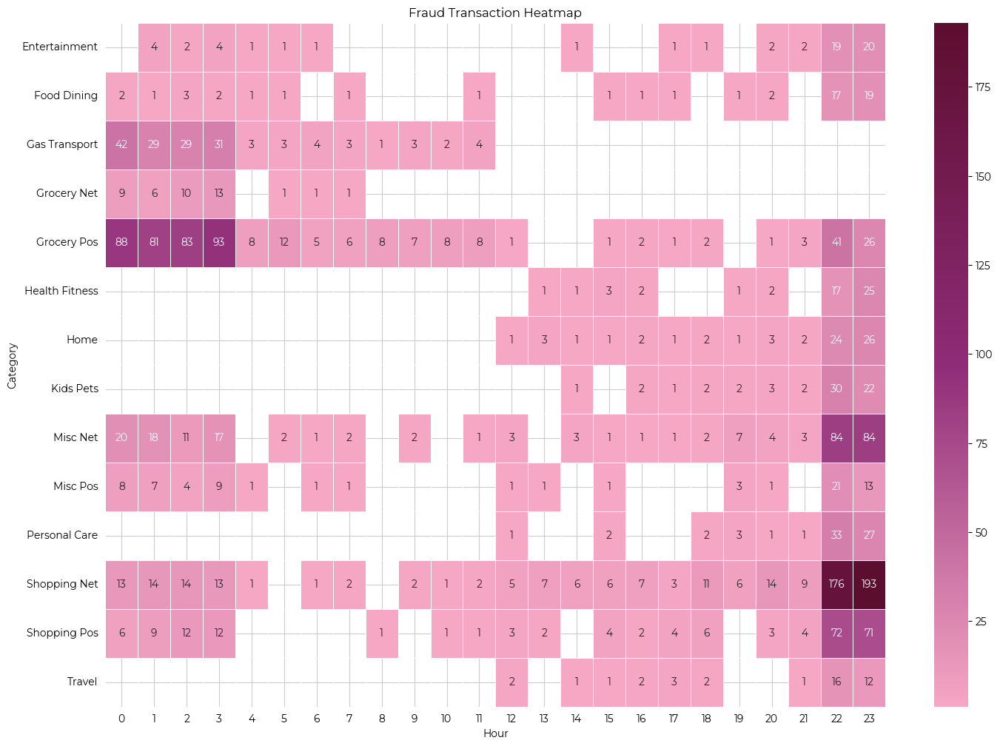

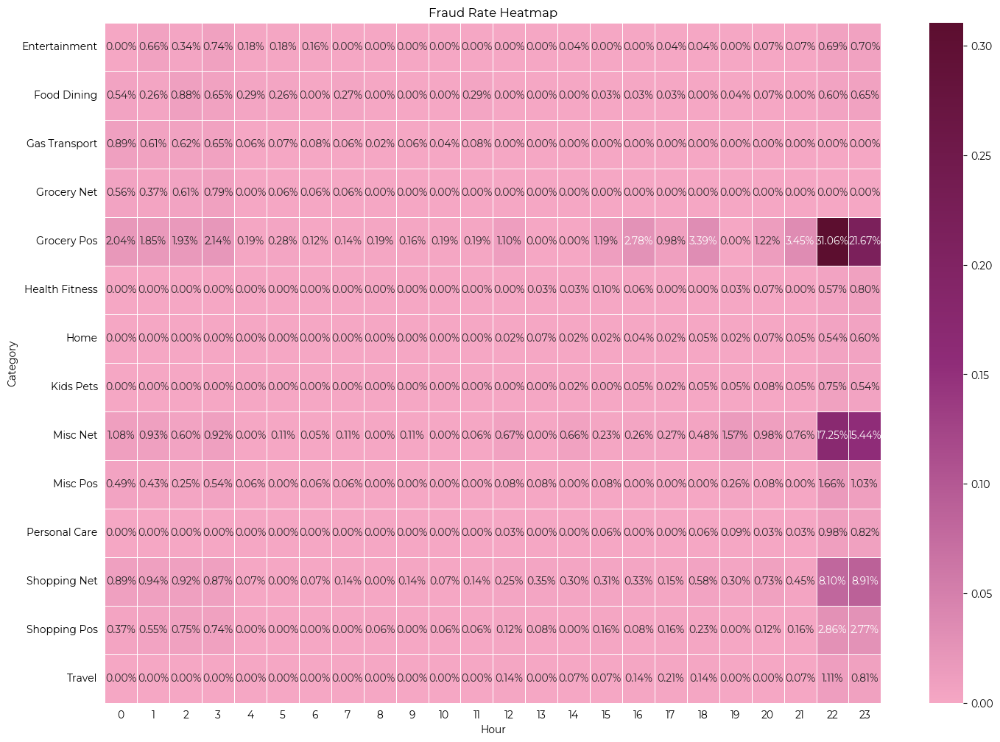

In [78]:
eda.plot_fraud_heatmap(df, 'category', 'hour')

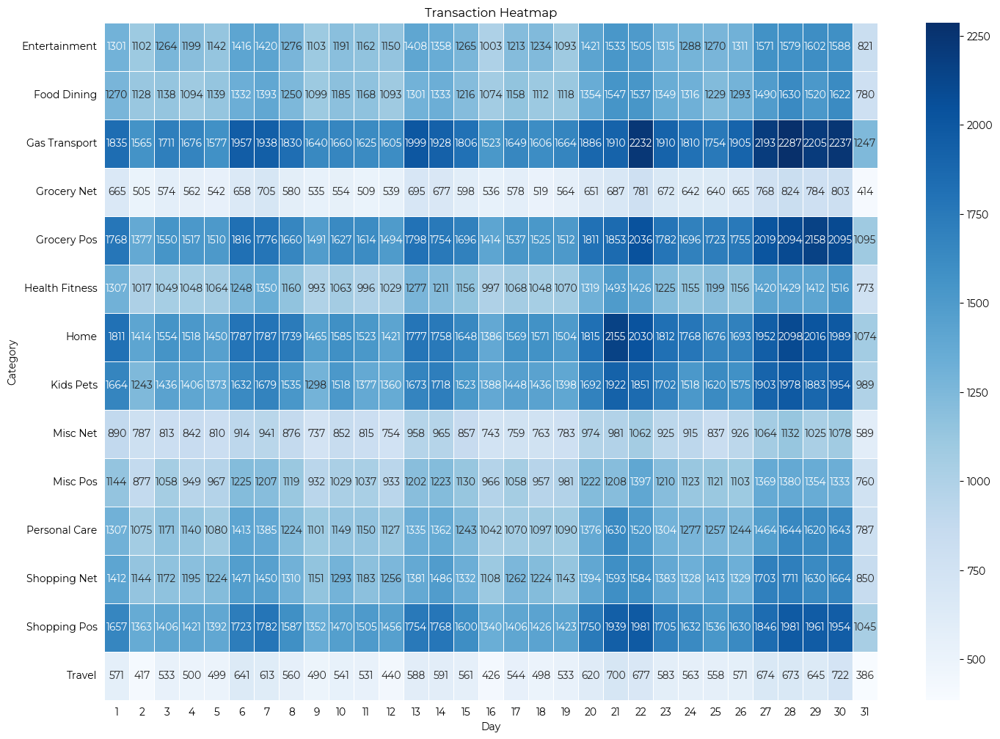

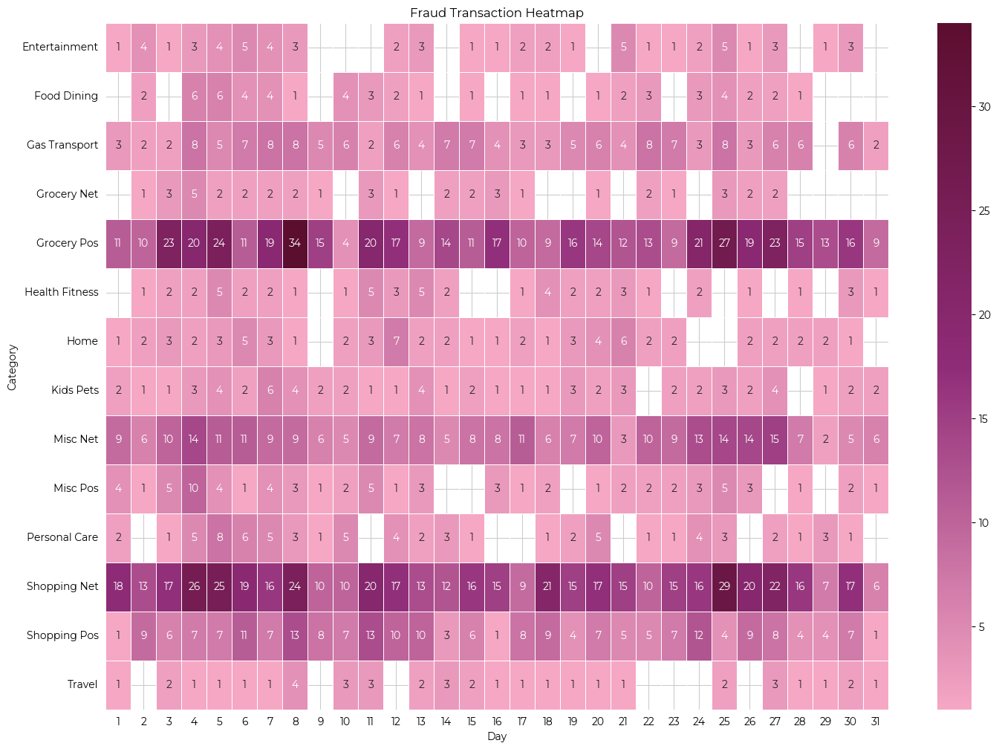

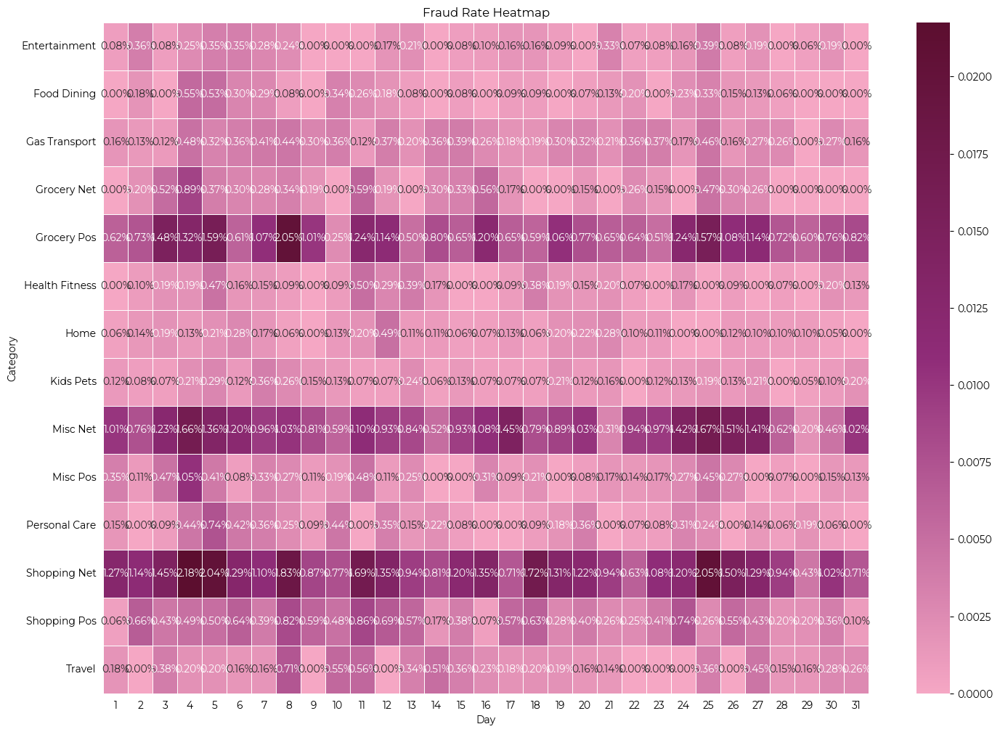

In [79]:
eda.plot_fraud_heatmap(df, 'category', 'day')

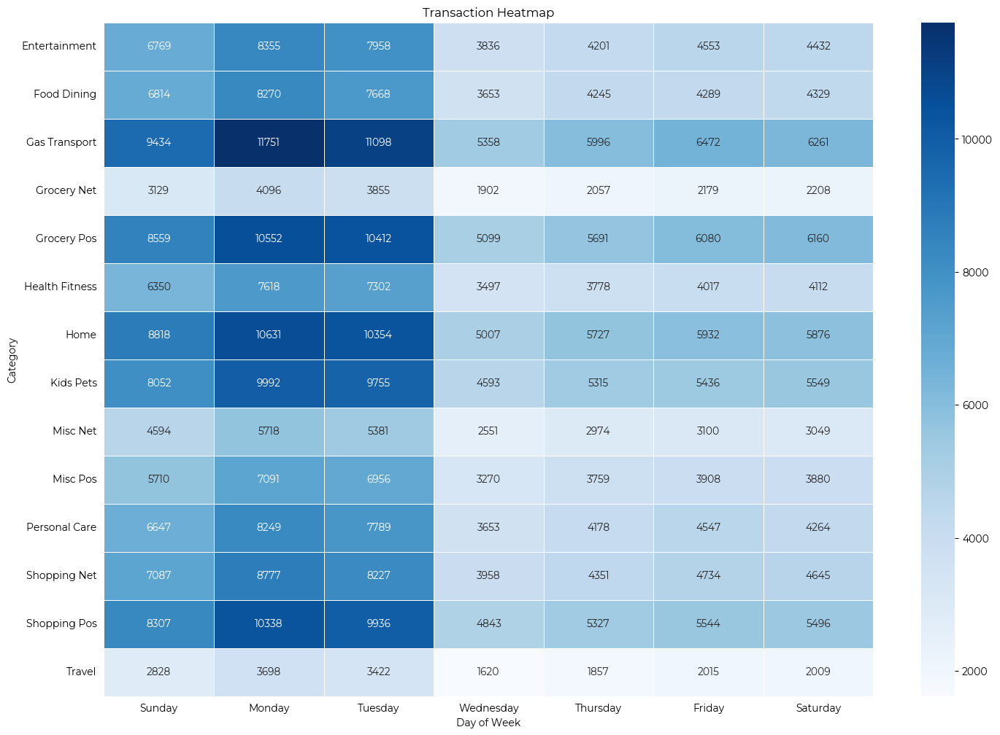

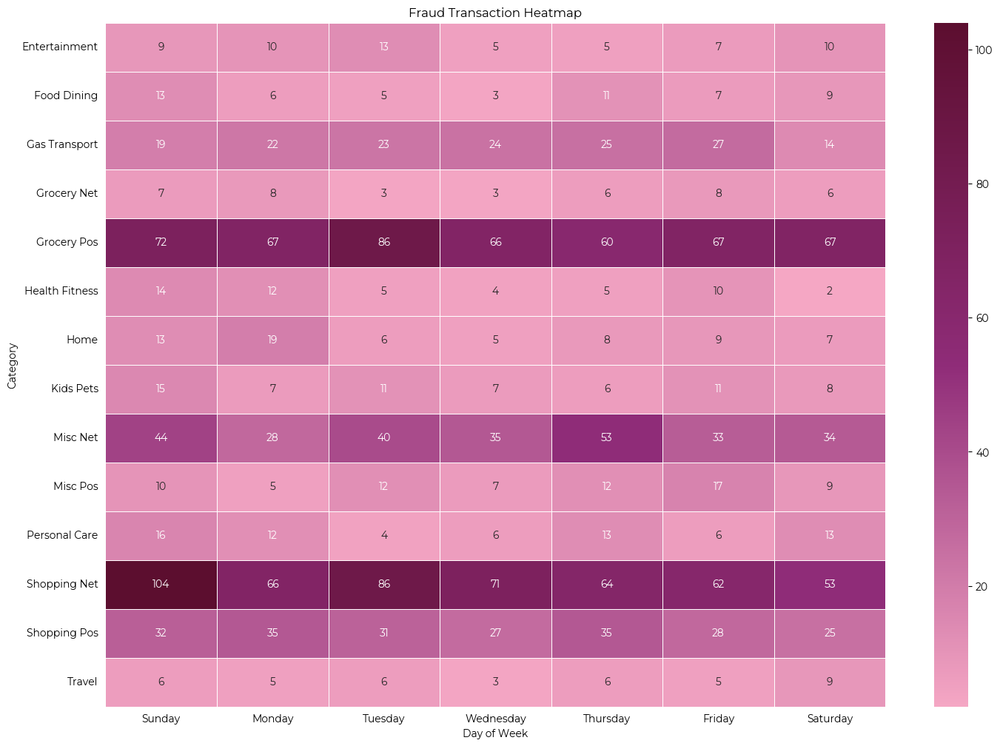

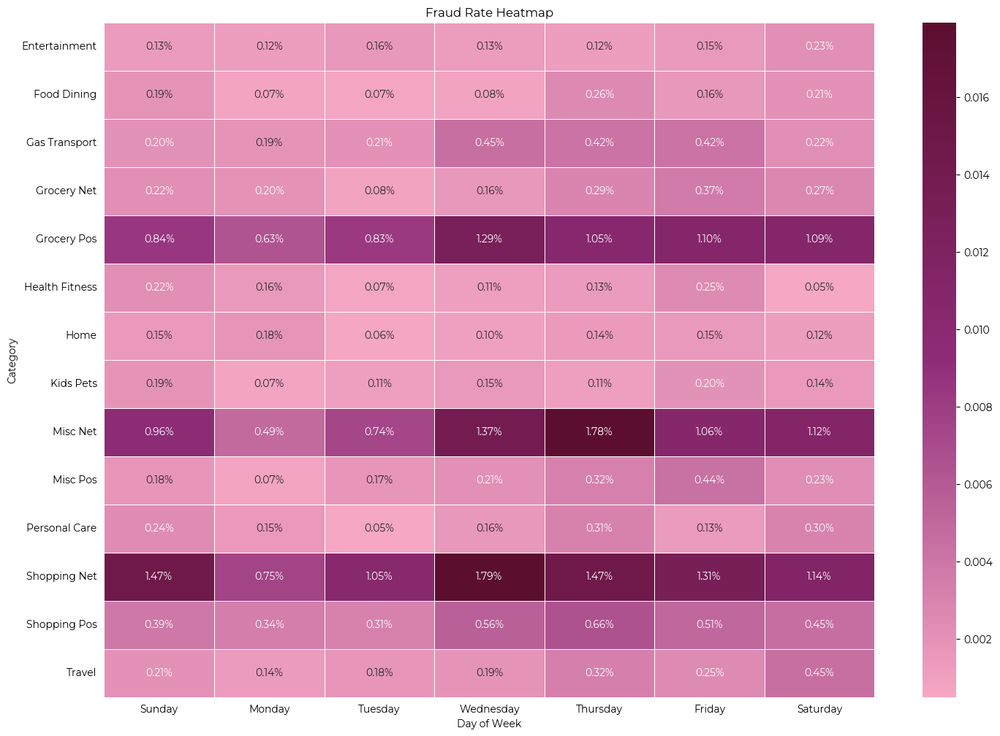

In [80]:
eda.plot_fraud_heatmap(df, 'category', 'day_of_week')

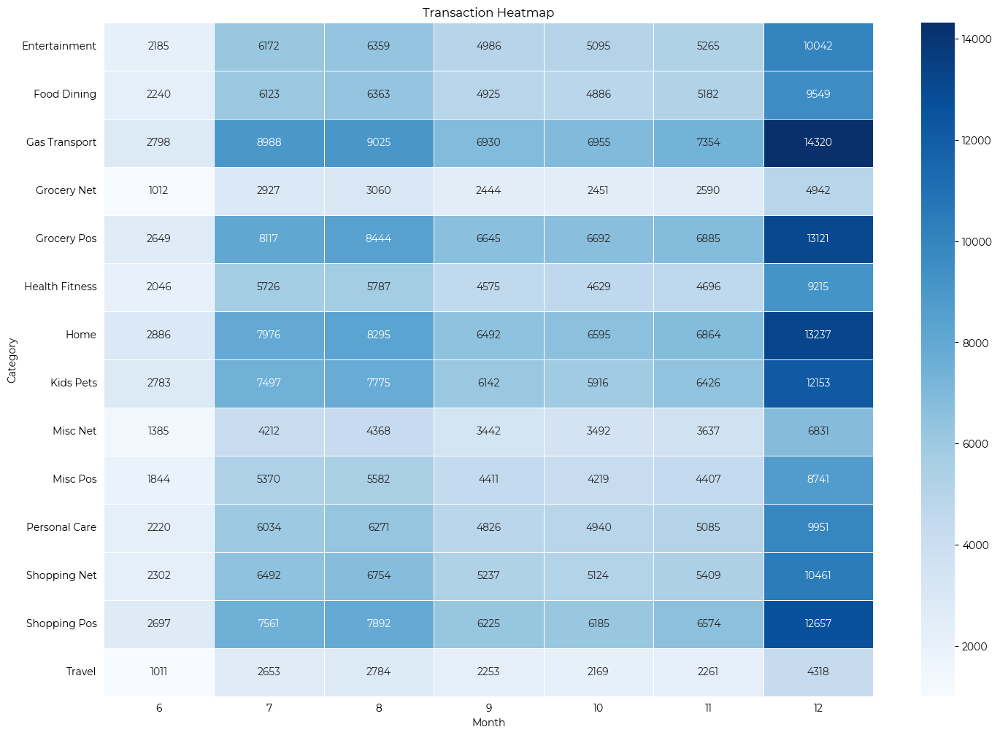

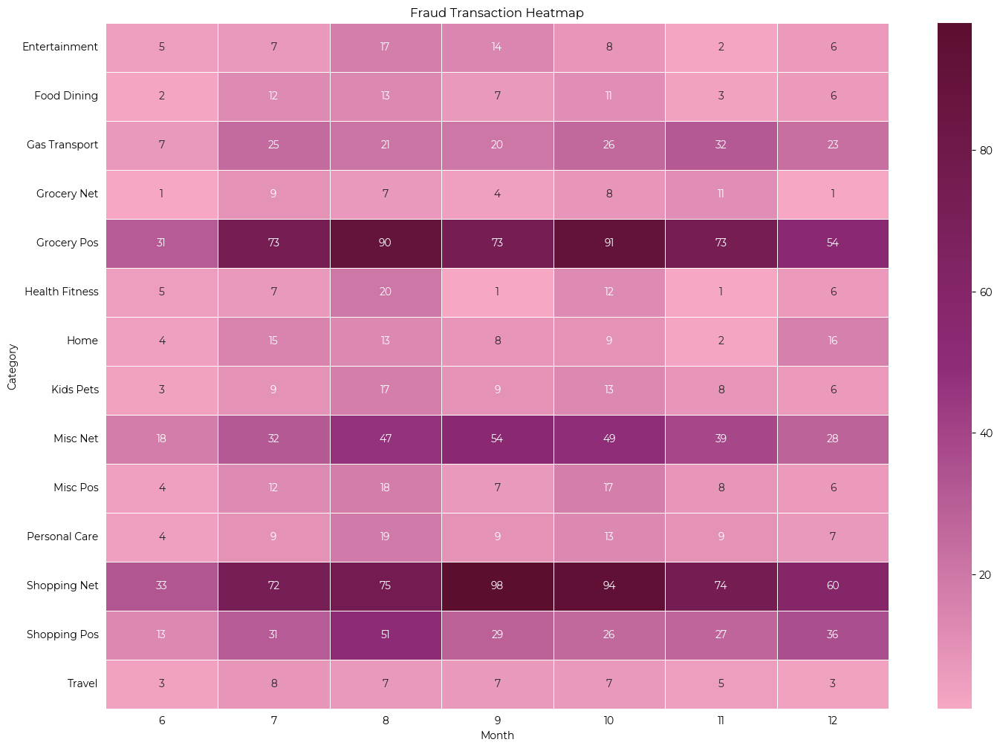

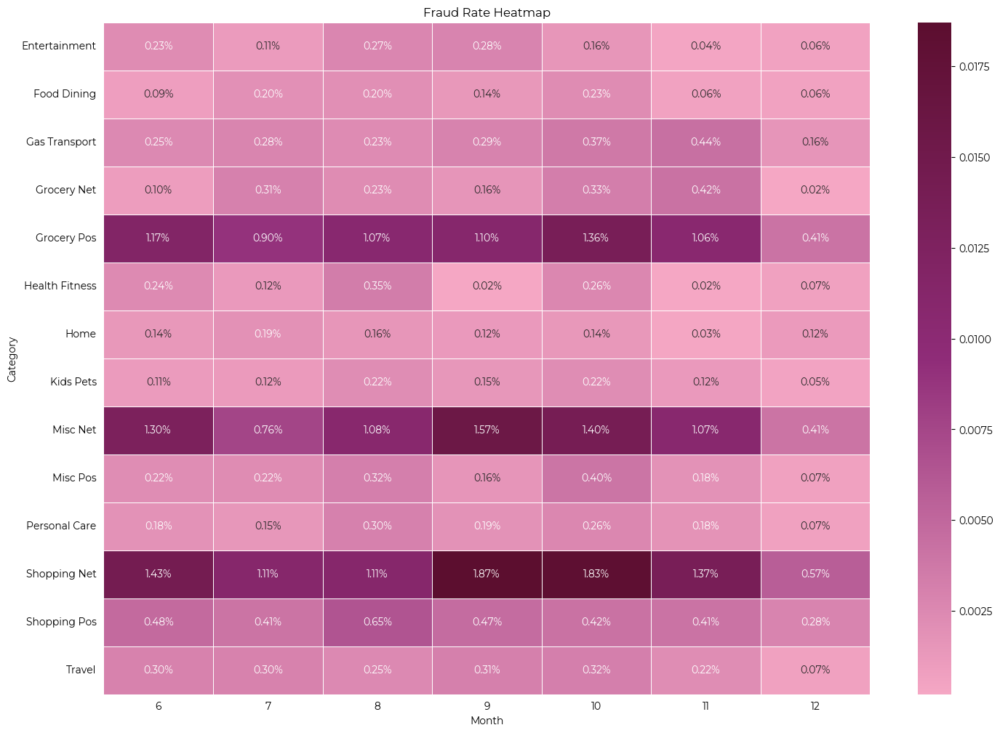

In [81]:
eda.plot_fraud_heatmap(df, 'category', 'month')

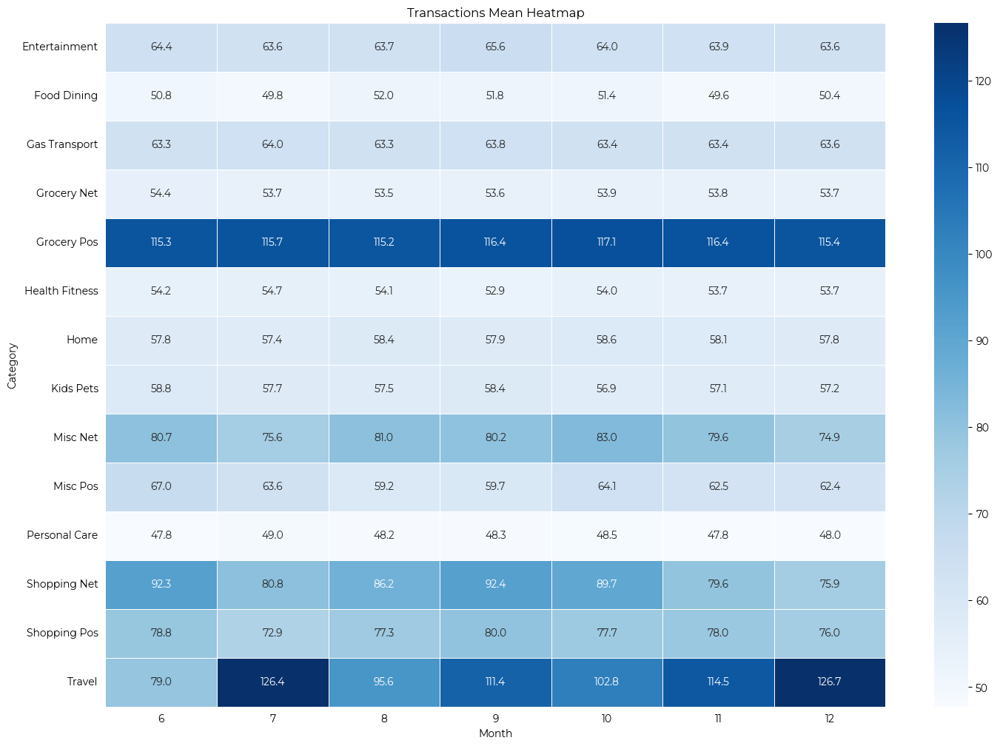

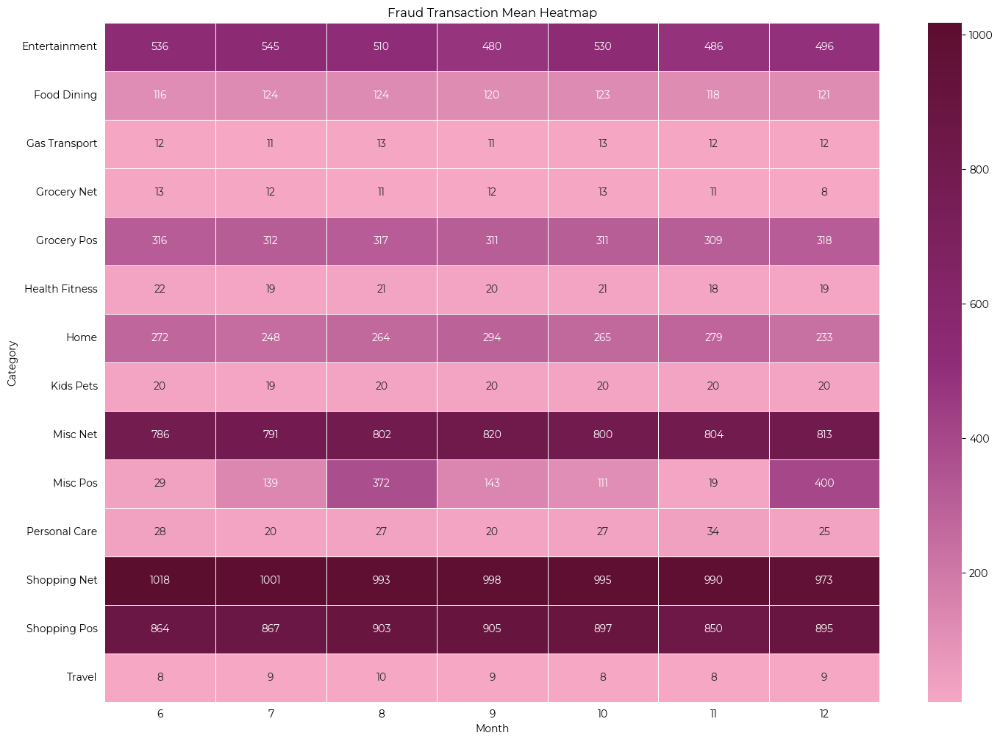

In [82]:
eda.plot_fraud_heatmap_statistic(df, 'category', 'month', 'mean')

## Geographical Fraud Distribution

### 10. Do fraud transactions happen more in specific locations?

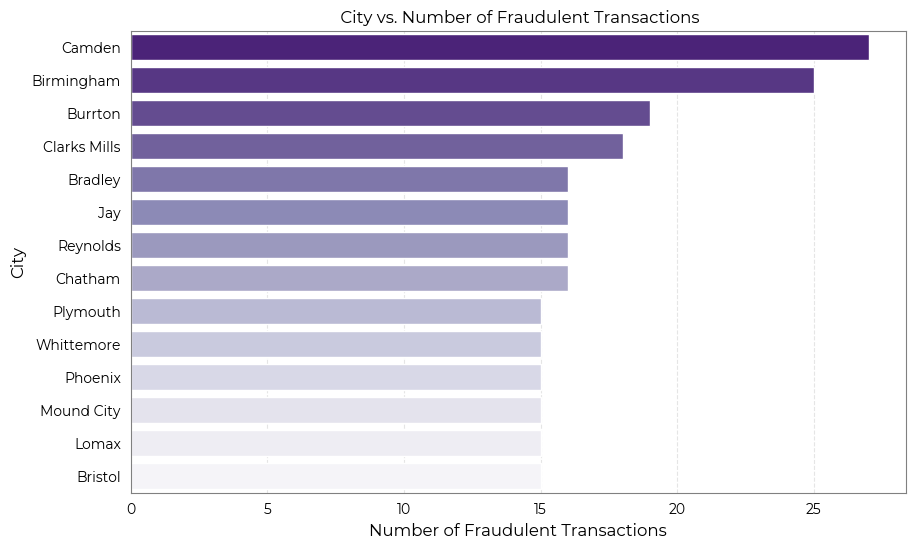

In [83]:
eda.plot_high_risk_transaction_types(df, 'city')

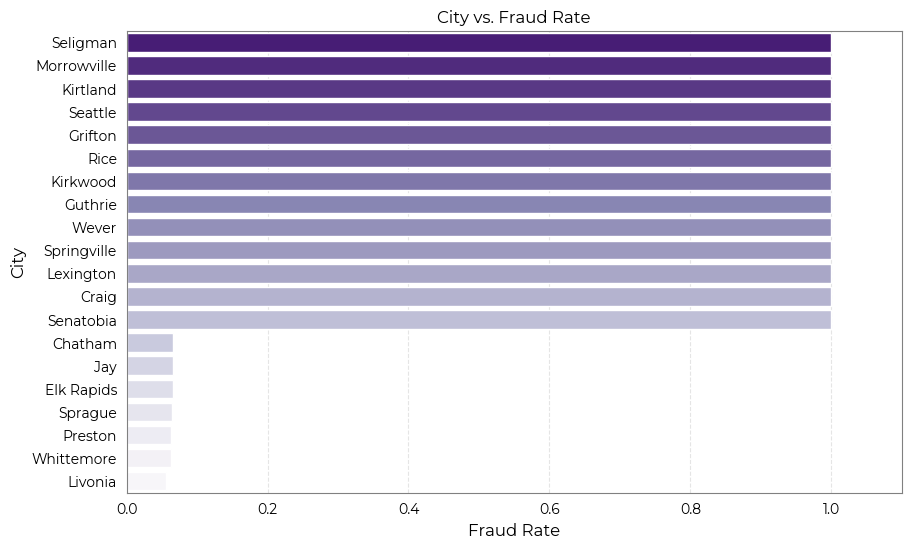

In [84]:
eda.plot_high_risk_transaction_types_fre(df, 'city')

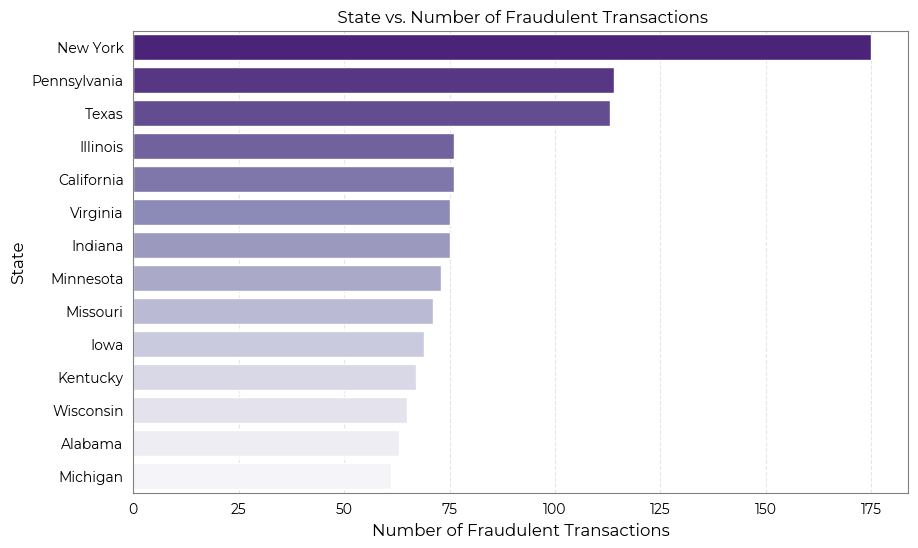

In [85]:
eda.plot_high_risk_transaction_types(df, 'state')

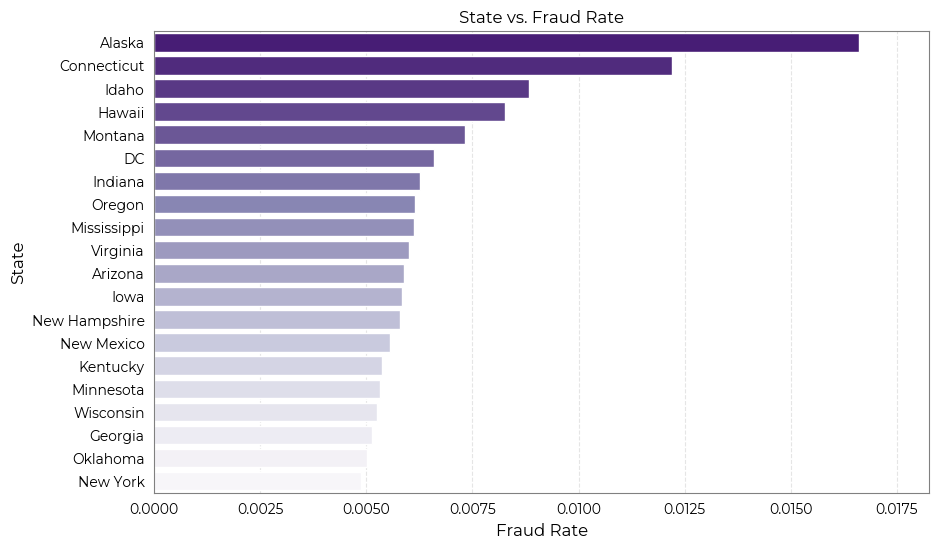

In [86]:
eda.plot_high_risk_transaction_types_fre(df, 'state')

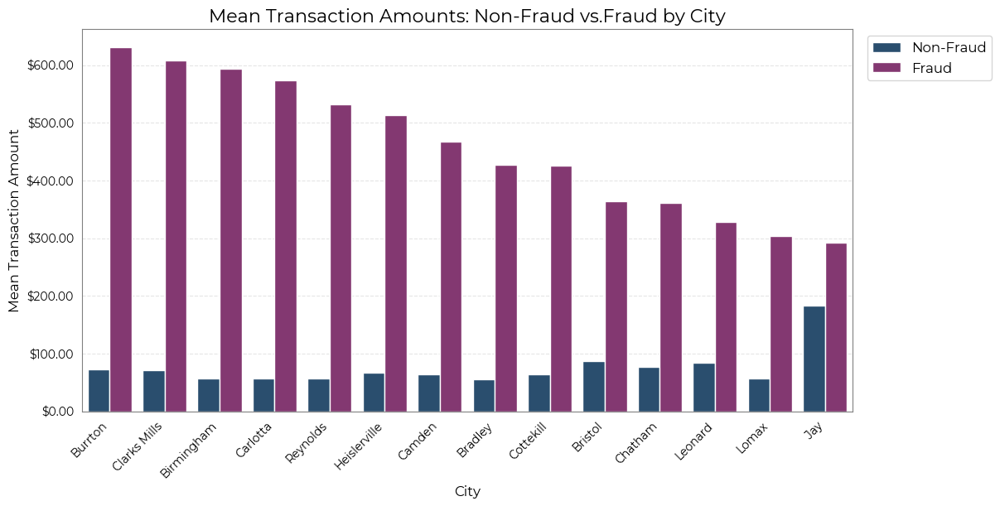

In [87]:
eda.plot_fraud_vs_nonfraud_means(df, 'city')

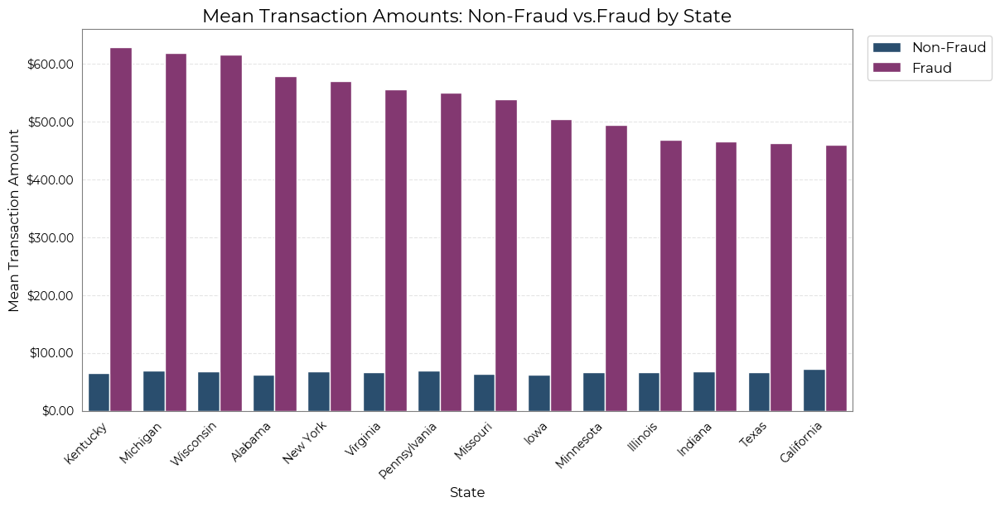

In [88]:
eda.plot_fraud_vs_nonfraud_means(df, 'state')

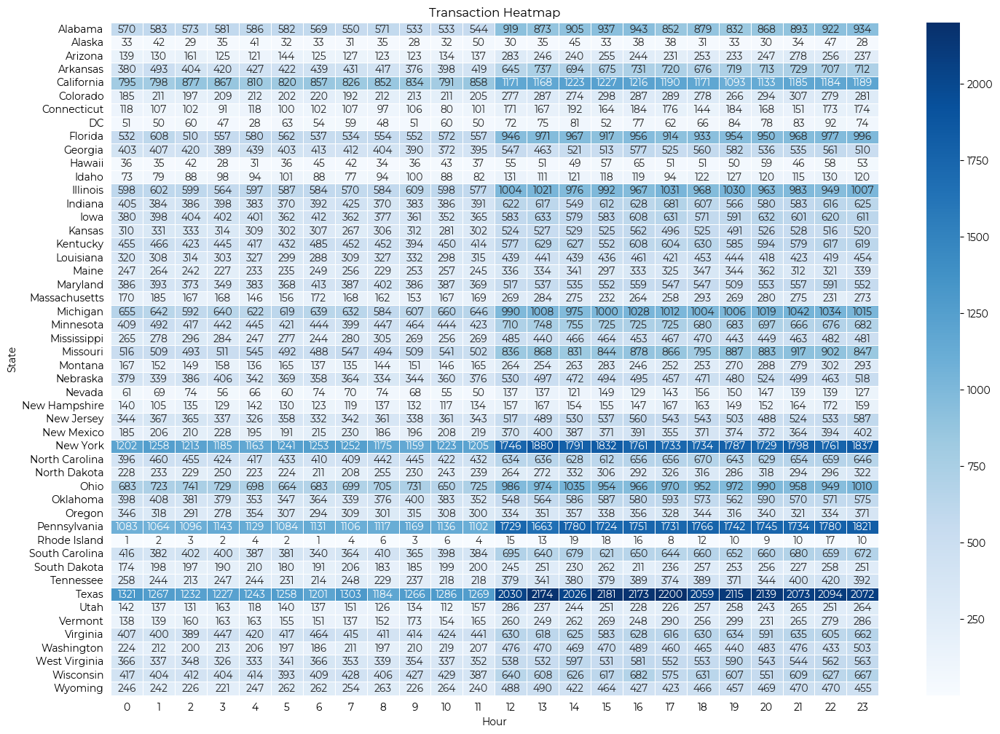

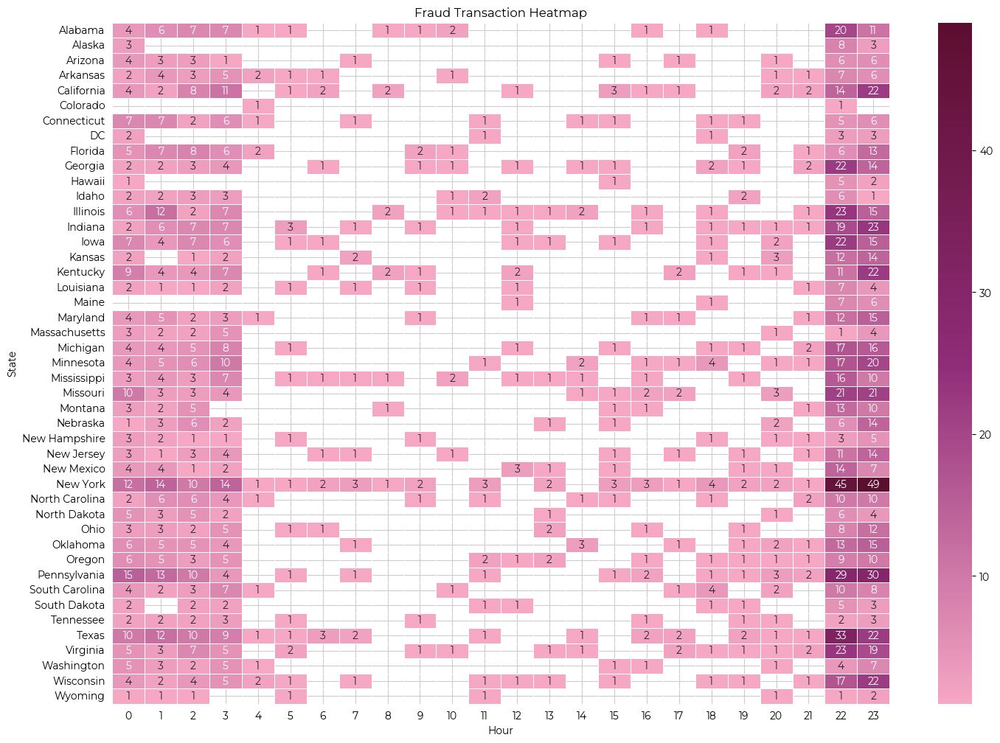

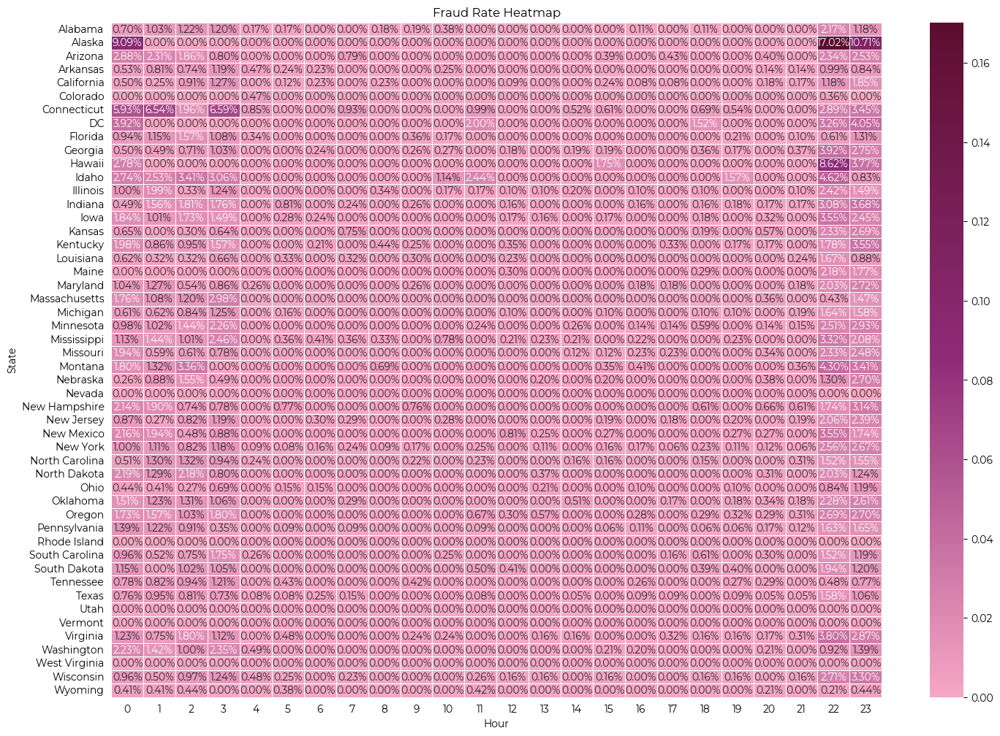

In [89]:
eda.plot_fraud_heatmap(df, 'state', 'hour')

## Customer Characteristics and Fraud

### 11. Are certain users or accounts more frequently targeted?

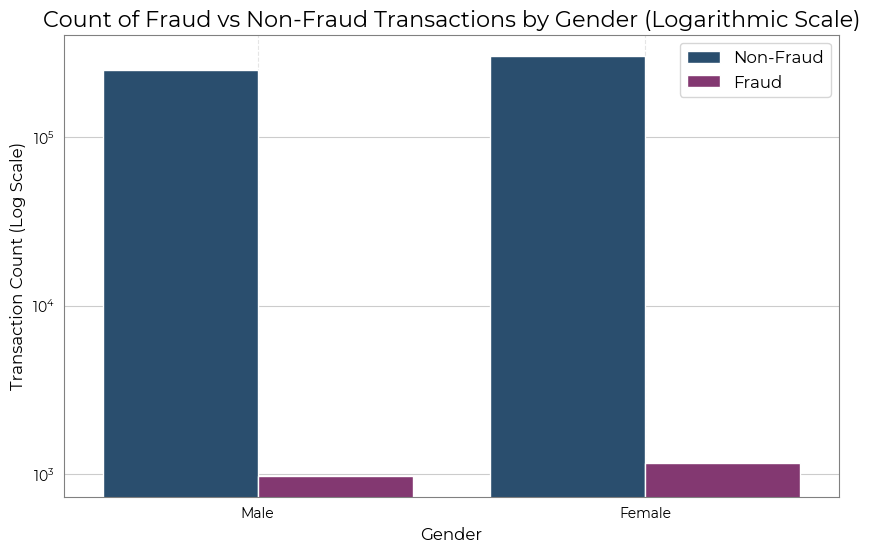

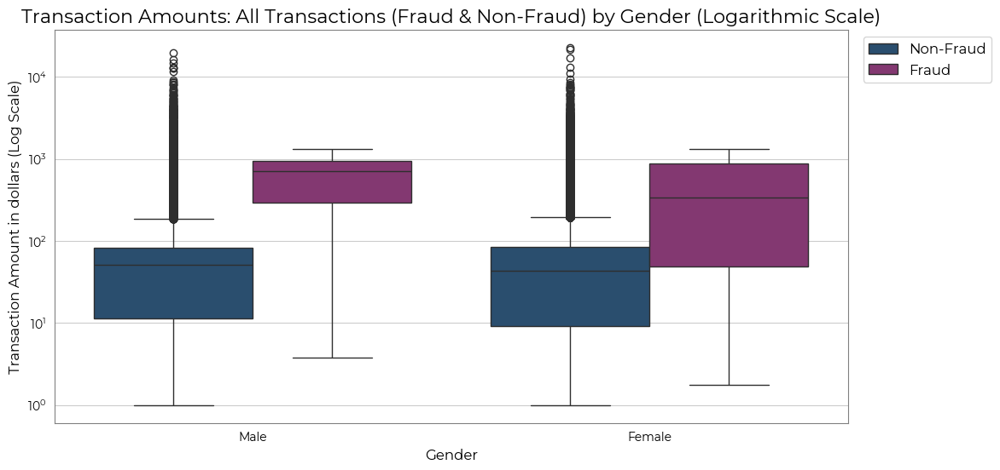

In [90]:
eda.plot_gender_fraud_and_box_plots(df)

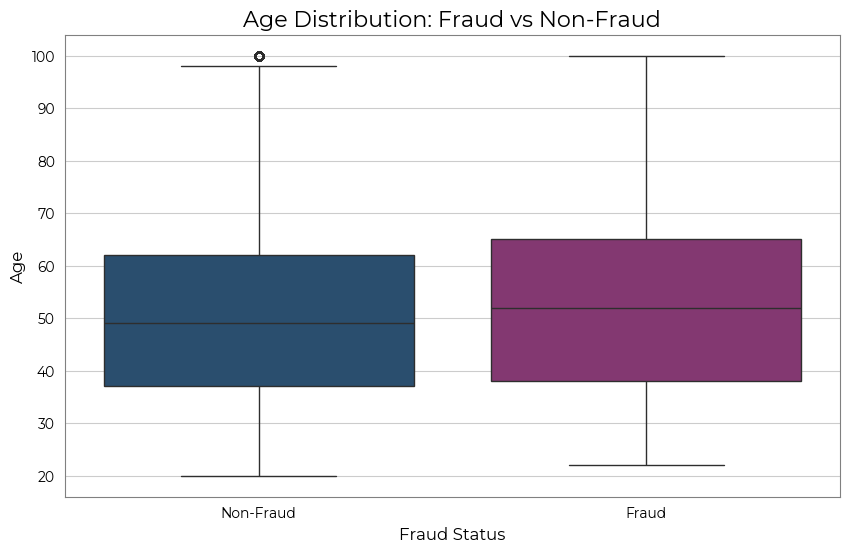

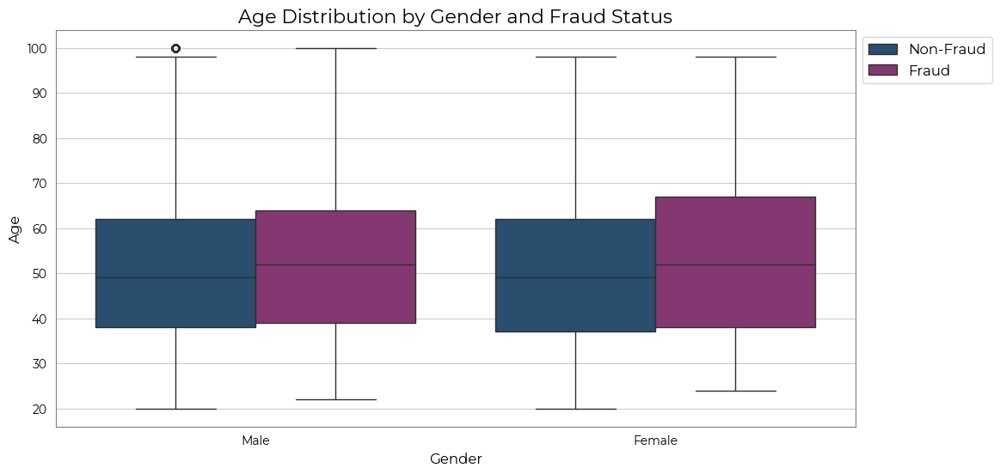

In [91]:
eda.plot_fraud_vs_nonfraud_age(df)

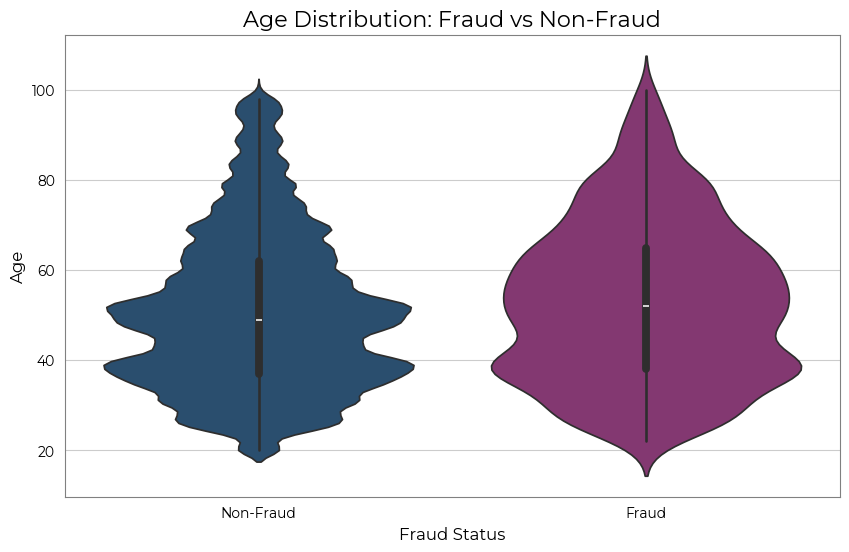

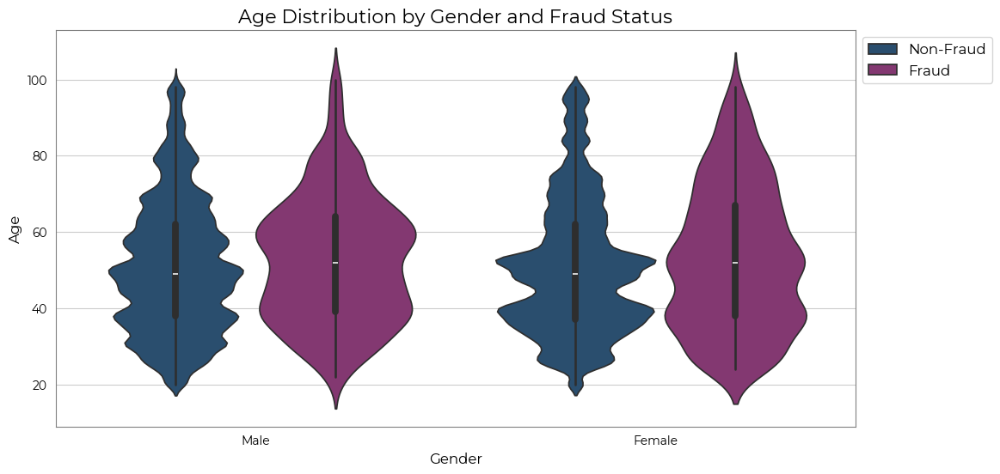

In [92]:
eda.plot_fraud_vs_nonfraud_age_violin(df)

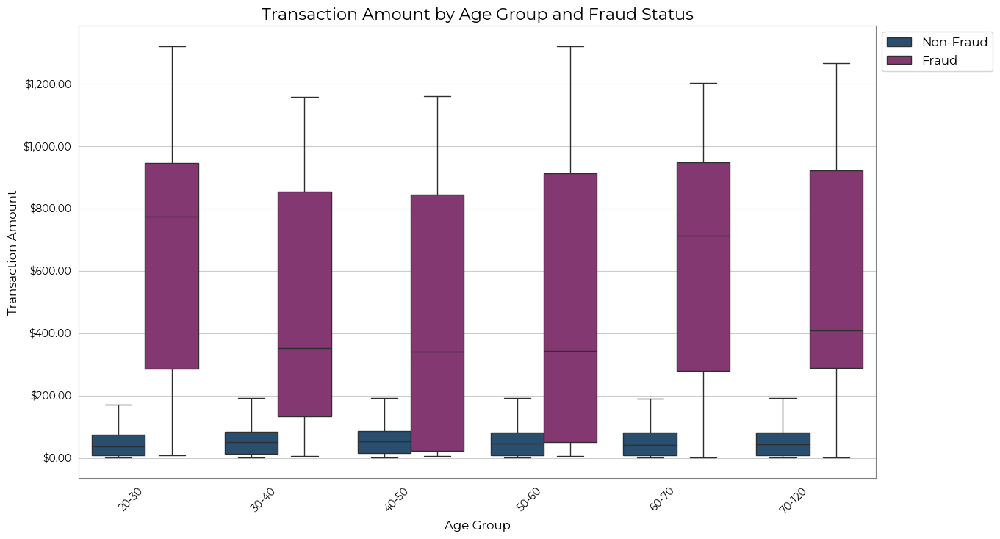

In [93]:
eda.plot_age_grouped_fraud_nonfraud(df)
